In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import calendar
from scipy.stats import f_oneway

In [4]:
SHG_Booking=pd.read_csv('SHG_Data.csv')

SHG_Booking

,Unnamed: 0,Booking ID,Hotel,Booking Date,Arrival Date,Lead Time,Nights,Guests,Distribution Channel,Customer Type,Country,Deposit Type,Avg Daily Rate,Status,Status Update,Cancelled,Revenue,Revenue Loss
0,0,3,Resort,2015-06-24,2015-07-01,7,1,1,Direct,Transient,United Kingdom,No Deposit,75.0,Check-Out,2015-07-02,No,75.0,0.0
1,1,4,Resort,2015-06-18,2015-07-01,13,1,1,Corporate,Transient,United Kingdom,No Deposit,75.0,Check-Out,2015-07-02,No,75.0,0.0
2,2,5,Resort,2015-06-17,2015-07-01,14,2,2,Online Travel Agent,Transient,United Kingdom,No Deposit,98.0,Check-Out,2015-07-03,No,196.0,0.0
3,3,6,Resort,2015-06-17,2015-07-01,14,2,2,Online Travel Agent,Transient,United Kingdom,No Deposit,98.0,Check-Out,2015-07-03,No,196.0,0.0
4,4,7,Resort,2015-07-01,2015-07-01,0,2,2,Direct,Transient,Portugal,No Deposit,107.0,Check-Out,2015-07-03,No,214.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117392,117392,119386,City,2017-08-07,2017-08-30,23,7,2,Offline Travel Agent,Transient,Belgium,No Deposit,96.0,Check-Out,2017-09-06,No,673.0,0.0
117393,117393,119387,City,2017-05-21,2017-08-31,102,7,3,Online Travel Agent,Transient,France,No Deposit,225.0,Check-Out,2017-09-07,No,1578.0,0.0
117394,117394,119388,City,2017-07-28,2017-08-31,34,7,2,Online Travel Agent,Transient,Germany,No Deposit,158.0,Check-Out,2017-09-07,No,1104.0,0.0
117395,117395,119389,City,2017-05-14,2017-08-31,109,7,2,Online Travel Agent,Transient,United Kingdom,No Deposit,104.0,Check-Out,2017-09-07,No,731.0,0.0


To remove the unnamed column:

In [5]:
SHG_Booking=pd.read_csv('SHG_Data.csv',index_col=0)

SHG_Booking

,Booking ID,Hotel,Booking Date,Arrival Date,Lead Time,Nights,Guests,Distribution Channel,Customer Type,Country,Deposit Type,Avg Daily Rate,Status,Status Update,Cancelled,Revenue,Revenue Loss
0,3,Resort,2015-06-24,2015-07-01,7,1,1,Direct,Transient,United Kingdom,No Deposit,75.0,Check-Out,2015-07-02,No,75.0,0.0
1,4,Resort,2015-06-18,2015-07-01,13,1,1,Corporate,Transient,United Kingdom,No Deposit,75.0,Check-Out,2015-07-02,No,75.0,0.0
2,5,Resort,2015-06-17,2015-07-01,14,2,2,Online Travel Agent,Transient,United Kingdom,No Deposit,98.0,Check-Out,2015-07-03,No,196.0,0.0
3,6,Resort,2015-06-17,2015-07-01,14,2,2,Online Travel Agent,Transient,United Kingdom,No Deposit,98.0,Check-Out,2015-07-03,No,196.0,0.0
4,7,Resort,2015-07-01,2015-07-01,0,2,2,Direct,Transient,Portugal,No Deposit,107.0,Check-Out,2015-07-03,No,214.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117392,119386,City,2017-08-07,2017-08-30,23,7,2,Offline Travel Agent,Transient,Belgium,No Deposit,96.0,Check-Out,2017-09-06,No,673.0,0.0
117393,119387,City,2017-05-21,2017-08-31,102,7,3,Online Travel Agent,Transient,France,No Deposit,225.0,Check-Out,2017-09-07,No,1578.0,0.0
117394,119388,City,2017-07-28,2017-08-31,34,7,2,Online Travel Agent,Transient,Germany,No Deposit,158.0,Check-Out,2017-09-07,No,1104.0,0.0
117395,119389,City,2017-05-14,2017-08-31,109,7,2,Online Travel Agent,Transient,United Kingdom,No Deposit,104.0,Check-Out,2017-09-07,No,731.0,0.0


In [6]:
SHG_Booking.info()

<class 'pandas.core.frame.DataFrame'>
Index: 117397 entries, 0 to 117396
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Booking ID            117397 non-null  int64  
 1   Hotel                 117397 non-null  object 
 2   Booking Date          117397 non-null  object 
 3   Arrival Date          117397 non-null  object 
 4   Lead Time             117397 non-null  int64  
 5   Nights                117397 non-null  int64  
 6   Guests                117397 non-null  int64  
 7   Distribution Channel  117397 non-null  object 
 8   Customer Type         117397 non-null  object 
 9   Country               117397 non-null  object 
 10  Deposit Type          117397 non-null  object 
 11  Avg Daily Rate        117397 non-null  float64
 12  Status                117397 non-null  object 
 13  Status Update         117397 non-null  object 
 14  Cancelled             117397 non-null  object 
 15  Reven

I noticed that the data type of the cleaned csv file has changed. Let go!

In [7]:
SHG_Booking['Booking Date']=pd.to_datetime(SHG_Booking['Booking Date'])
SHG_Booking['Arrival Date']=pd.to_datetime(SHG_Booking['Arrival Date'])
SHG_Booking['Status Update']=pd.to_datetime(SHG_Booking['Status Update'])
SHG_Booking['Hotel']=SHG_Booking['Hotel'].astype('category')
SHG_Booking['Distribution Channel']=SHG_Booking['Distribution Channel'].astype('category')
SHG_Booking['Customer Type']=SHG_Booking['Customer Type'].astype('category')
SHG_Booking['Country']=SHG_Booking['Country'].astype('category')
SHG_Booking['Deposit Type']=SHG_Booking['Deposit Type'].astype('category')
SHG_Booking['Cancelled']=SHG_Booking['Cancelled'].astype('category')
SHG_Booking['Status']=SHG_Booking['Status'].astype('category')

In [8]:
SHG_Booking.info()

<class 'pandas.core.frame.DataFrame'>
Index: 117397 entries, 0 to 117396
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Booking ID            117397 non-null  int64         
 1   Hotel                 117397 non-null  category      
 2   Booking Date          117397 non-null  datetime64[ns]
 3   Arrival Date          117397 non-null  datetime64[ns]
 4   Lead Time             117397 non-null  int64         
 5   Nights                117397 non-null  int64         
 6   Guests                117397 non-null  int64         
 7   Distribution Channel  117397 non-null  category      
 8   Customer Type         117397 non-null  category      
 9   Country               117397 non-null  category      
 10  Deposit Type          117397 non-null  category      
 11  Avg Daily Rate        117397 non-null  float64       
 12  Status                117397 non-null  category      
 13  Stat

For my analysis of monthly bookings, I needed to create  new columns Booking Month which is an extract of the months,month and year from the Booking Date.To do this, check next cell

In [9]:
SHG_Booking['Booking Month'] = SHG_Booking['Booking Date'].dt.month_name()

SHG_Booking['Booking_Month_Year'] = SHG_Booking['Booking Date'].dt.strftime('%b %Y')

def booking_season(month):
    if month in ['December', 'January', 'February']:
        return 'Winter'
    elif month in ['March', 'April', 'May']:
        return 'Spring'
    elif month in ['June', 'July', 'August']:
        return 'Summer'
    elif month in ['September', 'October', 'November']:
        return 'Fall'

SHG_Booking['Booking Season'] = SHG_Booking['Booking Month'].apply(booking_season)

SHG_Booking

,Booking ID,Hotel,Booking Date,Arrival Date,Lead Time,Nights,Guests,Distribution Channel,Customer Type,Country,Deposit Type,Avg Daily Rate,Status,Status Update,Cancelled,Revenue,Revenue Loss,Booking Month,Booking_Month_Year,Booking Season
0,3,Resort,2015-06-24,2015-07-01,7,1,1,Direct,Transient,United Kingdom,No Deposit,75.0,Check-Out,2015-07-02,No,75.0,0.0,June,Jun 2015,Summer
1,4,Resort,2015-06-18,2015-07-01,13,1,1,Corporate,Transient,United Kingdom,No Deposit,75.0,Check-Out,2015-07-02,No,75.0,0.0,June,Jun 2015,Summer
2,5,Resort,2015-06-17,2015-07-01,14,2,2,Online Travel Agent,Transient,United Kingdom,No Deposit,98.0,Check-Out,2015-07-03,No,196.0,0.0,June,Jun 2015,Summer
3,6,Resort,2015-06-17,2015-07-01,14,2,2,Online Travel Agent,Transient,United Kingdom,No Deposit,98.0,Check-Out,2015-07-03,No,196.0,0.0,June,Jun 2015,Summer
4,7,Resort,2015-07-01,2015-07-01,0,2,2,Direct,Transient,Portugal,No Deposit,107.0,Check-Out,2015-07-03,No,214.0,0.0,July,Jul 2015,Summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117392,119386,City,2017-08-07,2017-08-30,23,7,2,Offline Travel Agent,Transient,Belgium,No Deposit,96.0,Check-Out,2017-09-06,No,673.0,0.0,August,Aug 2017,Summer
117393,119387,City,2017-05-21,2017-08-31,102,7,3,Online Travel Agent,Transient,France,No Deposit,225.0,Check-Out,2017-09-07,No,1578.0,0.0,May,May 2017,Spring
117394,119388,City,2017-07-28,2017-08-31,34,7,2,Online Travel Agent,Transient,Germany,No Deposit,158.0,Check-Out,2017-09-07,No,1104.0,0.0,July,Jul 2017,Summer
117395,119389,City,2017-05-14,2017-08-31,109,7,2,Online Travel Agent,Transient,United Kingdom,No Deposit,104.0,Check-Out,2017-09-07,No,731.0,0.0,May,May 2017,Spring


In [10]:
SHG_Booking.info()

<class 'pandas.core.frame.DataFrame'>
Index: 117397 entries, 0 to 117396
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Booking ID            117397 non-null  int64         
 1   Hotel                 117397 non-null  category      
 2   Booking Date          117397 non-null  datetime64[ns]
 3   Arrival Date          117397 non-null  datetime64[ns]
 4   Lead Time             117397 non-null  int64         
 5   Nights                117397 non-null  int64         
 6   Guests                117397 non-null  int64         
 7   Distribution Channel  117397 non-null  category      
 8   Customer Type         117397 non-null  category      
 9   Country               117397 non-null  category      
 10  Deposit Type          117397 non-null  category      
 11  Avg Daily Rate        117397 non-null  float64       
 12  Status                117397 non-null  category      
 13  Stat

In [11]:
SHG_Booking['Booking Month']=SHG_Booking['Booking Month'].astype('category')

In [12]:
SHG_Booking['Booking_Month_Year'] = pd.to_datetime(SHG_Booking['Booking_Month_Year'], format="%b %Y")


In [13]:
SHG_Booking.info()

<class 'pandas.core.frame.DataFrame'>
Index: 117397 entries, 0 to 117396
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Booking ID            117397 non-null  int64         
 1   Hotel                 117397 non-null  category      
 2   Booking Date          117397 non-null  datetime64[ns]
 3   Arrival Date          117397 non-null  datetime64[ns]
 4   Lead Time             117397 non-null  int64         
 5   Nights                117397 non-null  int64         
 6   Guests                117397 non-null  int64         
 7   Distribution Channel  117397 non-null  category      
 8   Customer Type         117397 non-null  category      
 9   Country               117397 non-null  category      
 10  Deposit Type          117397 non-null  category      
 11  Avg Daily Rate        117397 non-null  float64       
 12  Status                117397 non-null  category      
 13  Stat


Booking Patterns:
●	What is the trend in booking patterns over time, and are there specific seasons or months with increased booking activity?
●	How does lead time vary across different booking channels, and is there a correlation between lead time and customer type?


C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\3341062293.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  Monthly_Booking = SHG_Booking.groupby('Booking Month')['Booking ID'].count().reset_index()


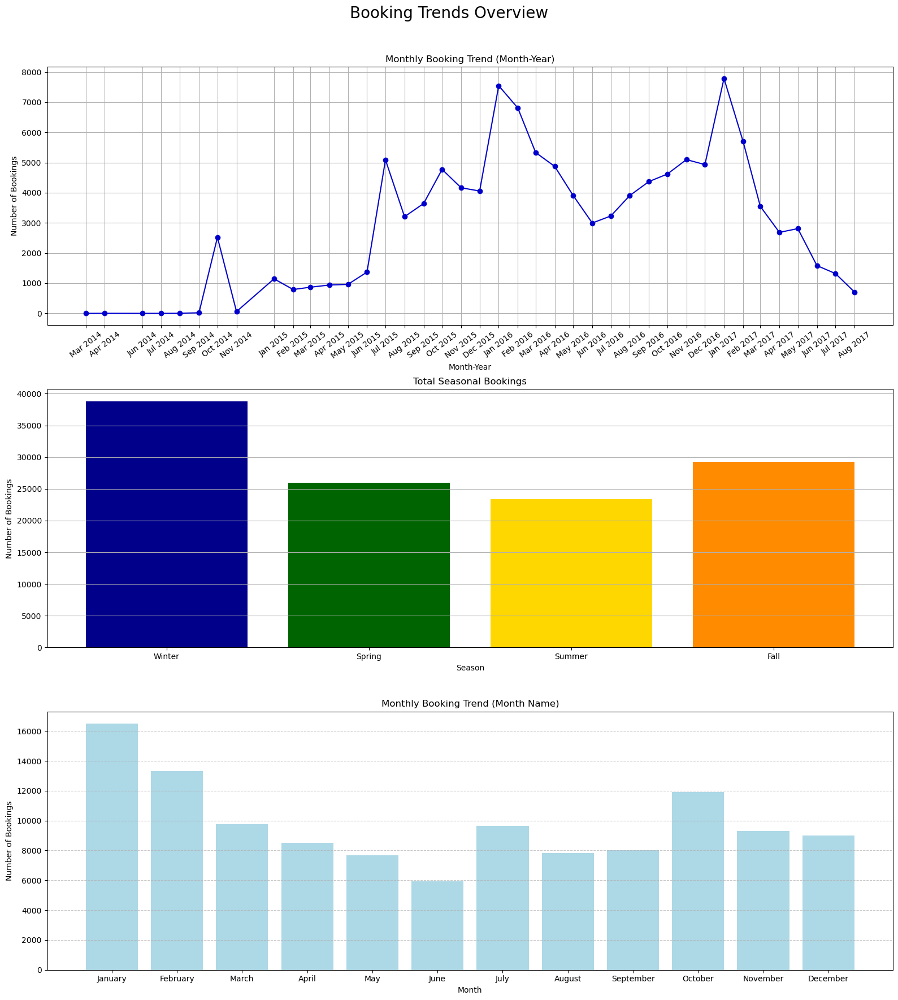

In [14]:
Monthly_Booking_Year = SHG_Booking.groupby('Booking_Month_Year')['Booking ID'].count().sort_index()

Seasonal_Booking = SHG_Booking.groupby('Booking Season')['Booking ID'].count().reindex(['Winter', 'Spring', 'Summer', 'Fall'])


Monthly_Booking = SHG_Booking.groupby('Booking Month')['Booking ID'].count().reset_index()
month_order = list(calendar.month_name)[1:] 
Monthly_Booking = Monthly_Booking.set_index('Booking Month').reindex(month_order).reset_index()
Monthly_Booking.dropna(inplace=True)

fig, axes = plt.subplots(3, 1, figsize=(16, 18))  

axes[0].plot(Monthly_Booking_Year.index, Monthly_Booking_Year.values, marker='o', color='mediumblue')
axes[0].set_title('Monthly Booking Trend (Month-Year)')
axes[0].set_xlabel('Month-Year')
axes[0].set_ylabel('Number of Bookings')
labels = Monthly_Booking_Year.index.strftime('%b %Y')
axes[0].set_xticks(Monthly_Booking_Year.index)
axes[0].set_xticklabels(labels, rotation=37)
axes[0].grid(True)

axes[1].bar(Seasonal_Booking.index, Seasonal_Booking.values, color=['darkblue', 'darkgreen', 'gold', 'darkorange'])
axes[1].set_title('Total Seasonal Bookings')
axes[1].set_xlabel('Season')
axes[1].set_ylabel('Number of Bookings')
axes[1].grid(axis='y')
axes[1].set_xticks(range(len(Seasonal_Booking.index)))
axes[1].set_xticklabels(Seasonal_Booking.index)

axes[2].bar(Monthly_Booking['Booking Month'], Monthly_Booking['Booking ID'], color='lightblue')
axes[2].set_title('Monthly Booking Trend (Month Name)')
axes[2].set_xlabel('Month')
axes[2].set_ylabel('Number of Bookings')
axes[2].set_xticks(range(len(Monthly_Booking['Booking Month'])))
axes[2].set_xticklabels(Monthly_Booking['Booking Month'], rotation=0)
axes[2].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.suptitle('Booking Trends Overview', fontsize=20)
plt.subplots_adjust(top=0.92)
plt.show()


C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this w

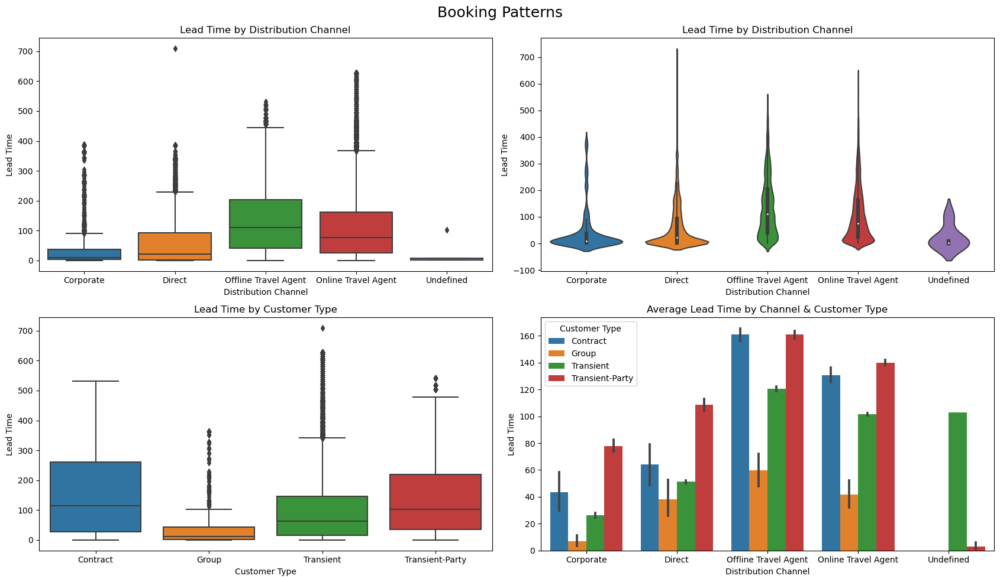

In [15]:
fig, axes = plt.subplots(2, 2, figsize=(17, 10))

sns.boxplot(data=SHG_Booking, x='Distribution Channel', y='Lead Time', ax=axes[0, 0])
axes[0, 0].set_title('Lead Time by Distribution Channel')

sns.violinplot(data=SHG_Booking, x='Distribution Channel', y='Lead Time', ax=axes[0, 1])
axes[0, 1].set_title('Lead Time by Distribution Channel')


sns.boxplot(data=SHG_Booking, x='Customer Type', y='Lead Time', ax=axes[1, 0])
axes[1, 0].set_title('Lead Time by Customer Type')

sns.barplot(data=SHG_Booking, x='Distribution Channel', y='Lead Time', hue='Customer Type', estimator='mean', ax=axes[1, 1])
axes[1, 1].set_title('Average Lead Time by Channel & Customer Type')



plt.suptitle('Booking Patterns', fontsize=18)
plt.tight_layout()
plt.show()


In [16]:
SHG_Booking['Customer Type'].unique()

['Transient', 'Contract', 'Transient-Party', 'Group']
Categories (4, object): ['Contract', 'Group', 'Transient', 'Transient-Party']

In [17]:
H0='Null Hypothesis, there is no significant difference'
H1='Alternative Hypothesis, there is significant difference'

stats,p_value=f_oneway(
    SHG_Booking[SHG_Booking['Customer Type']=='Transient']['Lead Time'].values,
    SHG_Booking[SHG_Booking['Customer Type']=='Group']['Lead Time'].values,
    SHG_Booking[SHG_Booking['Customer Type']=='Contract']['Lead Time'].values,
    SHG_Booking[SHG_Booking['Customer Type']=='Transient-Party']['Lead Time'].values,
)

print(f'stats:{stats} \np_value:{p_value}')

if p_value<0.05:
    print(f'{H1} between the Lead Time based on the customer type.')

else:
    print(f'{H0} between the Lead Time based on customer type.')
    

stats:1332.1351989809486 
p_value:0.0
Alternative Hypothesis, there is significant difference between the Lead Time based on the customer type.


Customer Behavior Analysis:
●	Which distribution channels contribute the most to bookings, and how does the average daily rate (ADR) differ across these channels?
●	Can we identify any patterns in the distribution of guests based on their country of origin, and how does this impact revenue?


C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\2142421111.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\2142421111.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



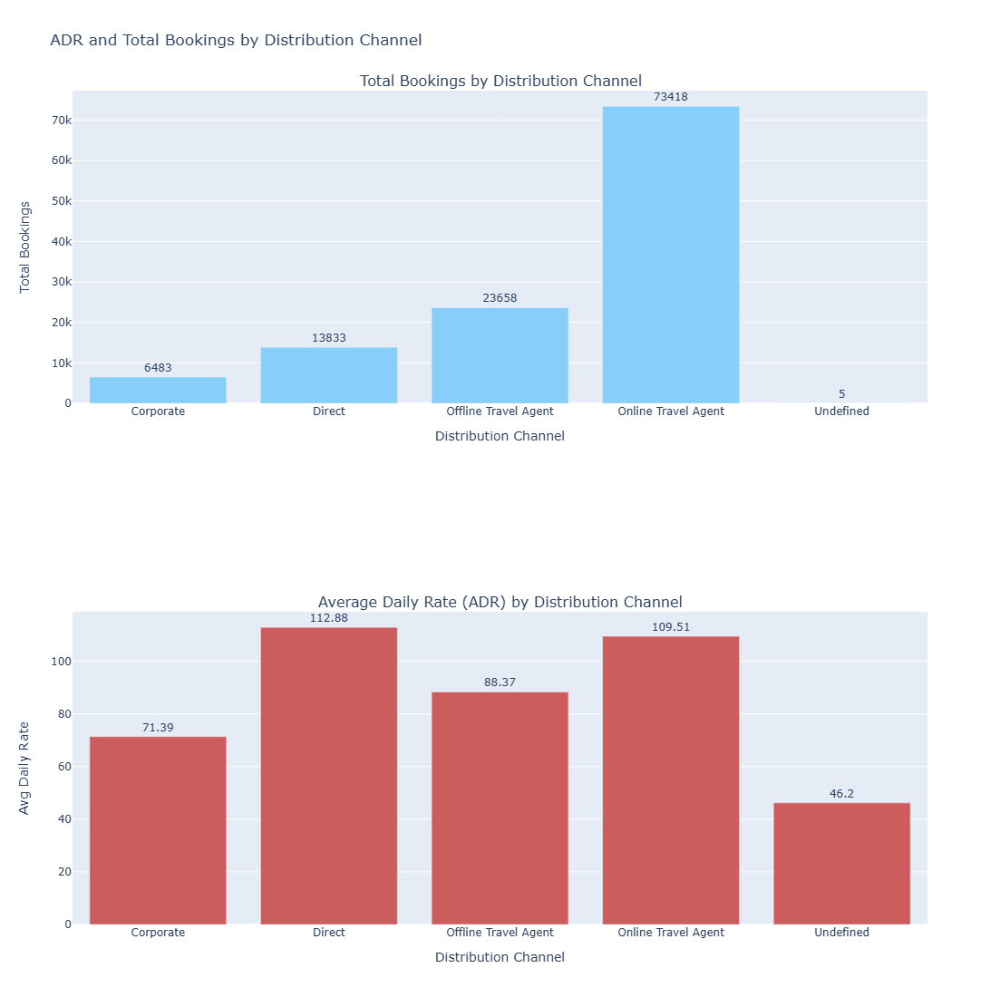

In [20]:
ADR_Channel = SHG_Booking.groupby('Distribution Channel')['Avg Daily Rate'].mean().reset_index()

Channel_Booking = SHG_Booking.groupby('Distribution Channel')['Booking ID'].count().reset_index()
Channel_Booking.rename(columns={'Booking ID': 'Total Bookings'}, inplace=True)

fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=("Total Bookings by Distribution Channel","Average Daily Rate (ADR) by Distribution Channel")
)

fig.add_trace(
    go.Bar(
        x=ADR_Channel['Distribution Channel'],
        y=ADR_Channel['Avg Daily Rate'],
        name='Avg Daily Rate',
        marker_color='indianred',
        text=ADR_Channel['Avg Daily Rate'].round(2),
        textposition='outside'
    ),
    row=2, col=1
)

fig.add_trace(
    go.Bar(
        x=Channel_Booking['Distribution Channel'],
        y=Channel_Booking['Total Bookings'],
        name='Total Bookings',
        marker_color='lightskyblue',
        text=Channel_Booking['Total Bookings'],
        textposition='outside'
    ),
    row=1, col=1
)


fig.update_layout(
    title_text="ADR and Total Bookings by Distribution Channel",
    showlegend=False,
    height=1100,
    width=1000
)

fig.update_xaxes(title_text="Distribution Channel", row=1, col=1)
fig.update_yaxes(title_text="Avg Daily Rate", row=2, col=1)

fig.update_xaxes(title_text="Distribution Channel", row=2, col=1)
fig.update_yaxes(title_text="Total Bookings", row=1, col=1)

fig.show()


C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\4111594380.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\4111594380.py:13: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



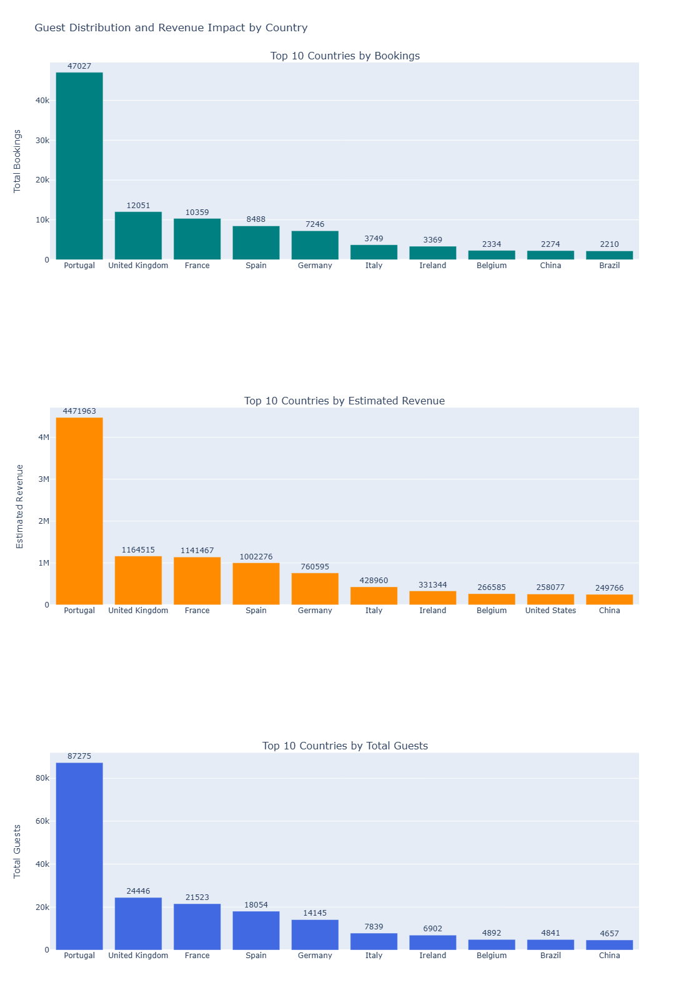

In [21]:
top_countries = SHG_Booking['Country'].value_counts().reset_index()
top_countries.columns = ['Country', 'Total Bookings']
top_countries = top_countries.head(10)

revenue_by_country = SHG_Booking.groupby('Country').agg(
    Total_Bookings=('Booking ID', 'count'),
    Avg_ADR=('Avg Daily Rate', 'mean')
).reset_index()
revenue_by_country['Estimated_Revenue'] = revenue_by_country['Total_Bookings'] * revenue_by_country['Avg_ADR']
revenue_by_country = revenue_by_country.sort_values('Estimated_Revenue', ascending=False).head(10)

SHG_Booking['Total Guests'] = SHG_Booking['Guests'] 
guests_by_country = SHG_Booking.groupby('Country')['Total Guests'].sum().reset_index()
guests_by_country = guests_by_country.sort_values('Total Guests', ascending=False).head(10)

fig = make_subplots(
    rows=3, cols=1,
    subplot_titles=(
        "Top 10 Countries by Bookings",
        "Top 10 Countries by Estimated Revenue",
        "Top 10 Countries by Total Guests"
    )
)


fig.add_trace(
    go.Bar(
        x=top_countries['Country'],
        y=top_countries['Total Bookings'],
        marker_color='teal',
        text=top_countries['Total Bookings'],
        textposition='outside',
        name='Bookings'
    ),
    row=1, col=1
)


fig.add_trace(
    go.Bar(
        x=revenue_by_country['Country'],
        y=revenue_by_country['Estimated_Revenue'],
        marker_color='darkorange',
        text=revenue_by_country['Estimated_Revenue'].round(0),
        textposition='outside',
        name='Revenue'
    ),
    row=2, col=1
)


fig.add_trace(
    go.Bar(
        x=guests_by_country['Country'],
        y=guests_by_country['Total Guests'],
        marker_color='royalblue',
        text=guests_by_country['Total Guests'],
        textposition='outside',
        name='Guests'
    ),
    row=3, col=1
)


fig.update_layout(
    title_text="Guest Distribution and Revenue Impact by Country",
    height=1600,
    width=1200,
    showlegend=False
)

# === Y-axis Titles ===
fig.update_yaxes(title_text="Total Bookings", row=1, col=1)
fig.update_yaxes(title_text="Estimated Revenue", row=2, col=1)
fig.update_yaxes(title_text="Total Guests", row=3, col=1)

fig.show()


C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\1289908555.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



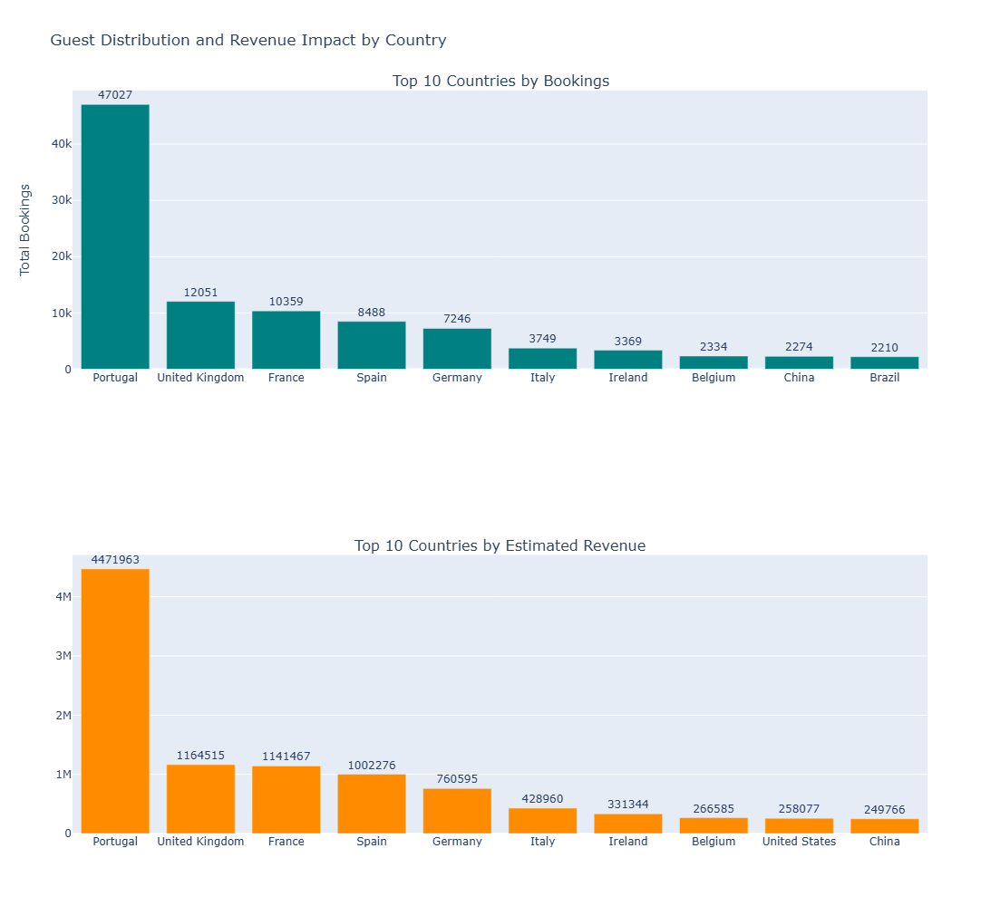

In [23]:
top_countries = SHG_Booking['Country'].value_counts().reset_index()
top_countries.columns = ['Country', 'Total Bookings']


top_countries = top_countries.head(10)

revenue_by_country = SHG_Booking.groupby('Country').agg(
    Total_Bookings=('Booking ID', 'count'),
    Avg_ADR=('Avg Daily Rate', 'mean')
).reset_index()

revenue_by_country['Estimated_Revenue'] = revenue_by_country['Total_Bookings'] * revenue_by_country['Avg_ADR']


revenue_by_country = revenue_by_country.sort_values('Estimated_Revenue', ascending=False).head(10)



fig = make_subplots(rows=2, cols=1,
                    subplot_titles=("Top 10 Countries by Bookings", "Top 10 Countries by Estimated Revenue"))


fig.add_trace(
    go.Bar(x=top_countries['Country'],
           y=top_countries['Total Bookings'],
           marker_color='teal',
           text=top_countries['Total Bookings'],
           textposition='outside',
           name='Bookings'),
    row=1, col=1
)


fig.add_trace(
    go.Bar(x=revenue_by_country['Country'],
           y=revenue_by_country['Estimated_Revenue'],
           marker_color='darkorange',
           text=revenue_by_country['Estimated_Revenue'].round(0),
           textposition='outside',
           name='Revenue'),
    row=2, col=1
)

fig.update_layout(
    title_text="Guest Distribution and Revenue Impact by Country",
    height=1000,
    width=1200,
    showlegend=False
)

fig.update_yaxes(title_text="Total Bookings", row=1, col=1)
fig.update_yaxes(title_text="Estimated Revenue (ADR × Bookings)", row=1, col=2)

fig.show()


Cancellation Analysis:
●	What factors are most strongly correlated with cancellations, and can we predict potential cancellations based on certain variables?
●	How does the revenue loss from cancellations compare across different customer segments and distribution channels?


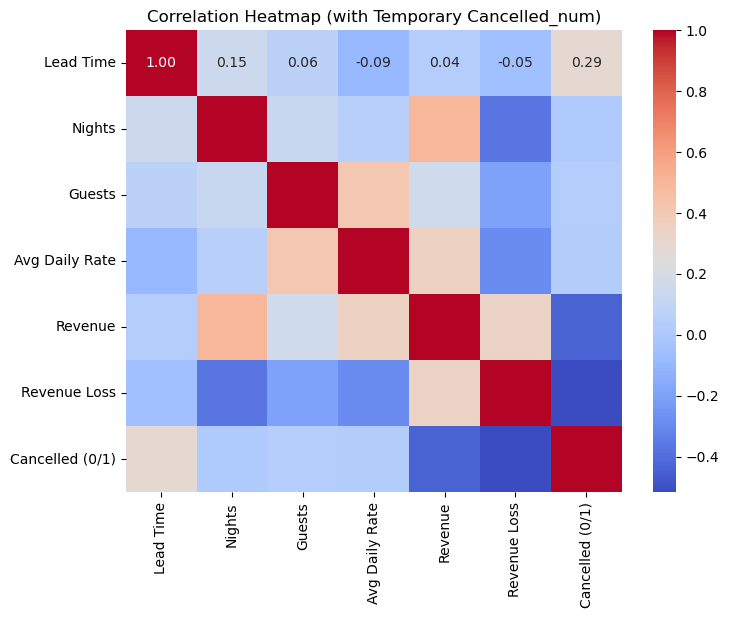

In [26]:
temp_df = SHG_Booking[['Lead Time', 'Nights', 'Guests', 'Avg Daily Rate', 
                       'Revenue', 'Revenue Loss']].copy()

temp_df['Cancelled (0/1)'] = SHG_Booking['Cancelled'].map({'Yes': 1, 'No': 0})


corr_df = temp_df.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap (with Temporary Cancelled_num)")
plt.show()


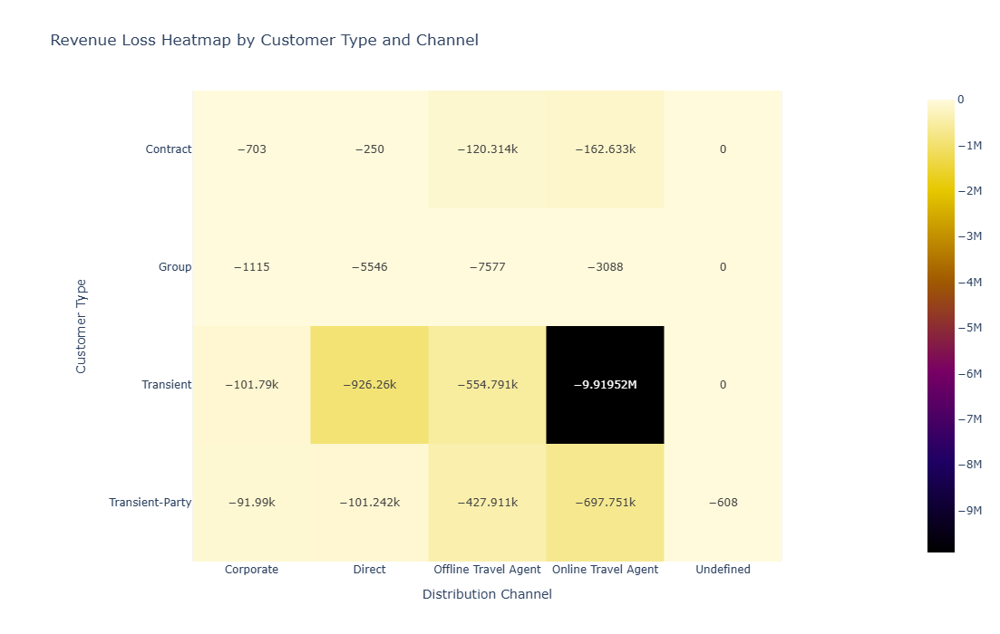

In [22]:
pivot_heatmap = SHG_Booking.pivot_table(
    index='Customer Type',
    columns='Distribution Channel',
    values='Revenue Loss',
    aggfunc='sum',
    fill_value=0
)

fig = px.imshow(pivot_heatmap,
                title='Revenue Loss Heatmap by Customer Type and Channel',
                text_auto=True,
                color_continuous_scale='electric')
fig.update_layout(
    height=700,
    width=900,
    
)

fig.show()

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\10824373.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\10824373.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\10824373.py:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



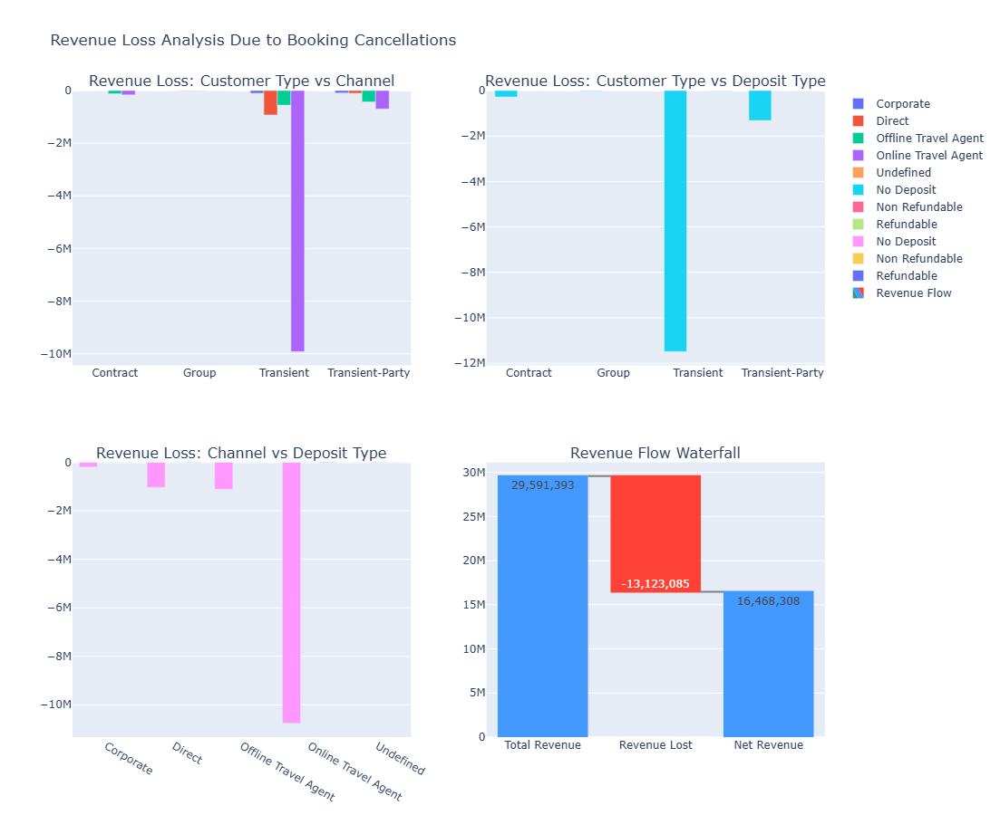

In [28]:
total_loss = SHG_Booking['Revenue Loss'].sum()
total_revenue = SHG_Booking['Revenue'].sum()
net_revenue = total_revenue + total_loss

canceled_df = SHG_Booking[SHG_Booking['Cancelled'] == 'Yes']

loss_by_cust_channel = canceled_df.groupby(
    ['Customer Type', 'Distribution Channel']
)['Revenue Loss'].sum().reset_index()

loss_by_cust_deposit = canceled_df.groupby(
    ['Customer Type', 'Deposit Type']
)['Revenue Loss'].sum().reset_index()

loss_by_channel_deposit = canceled_df.groupby(
    ['Distribution Channel', 'Deposit Type']
)['Revenue Loss'].sum().reset_index()

fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        "Revenue Loss: Customer Type vs Channel",
        "Revenue Loss: Customer Type vs Deposit Type",
        "Revenue Loss: Channel vs Deposit Type",
        "Revenue Flow Waterfall"
    ),
    specs=[[{"type": "xy"}, {"type": "xy"}],
           [{"type": "xy"}, {"type": "waterfall"}]],
    vertical_spacing=0.15,
    horizontal_spacing=0.1
)

for channel in loss_by_cust_channel['Distribution Channel'].unique():
    temp = loss_by_cust_channel[loss_by_cust_channel['Distribution Channel'] == channel]
    fig.add_trace(
        go.Bar(name=channel, x=temp['Customer Type'], y=temp['Revenue Loss']),
        row=1, col=1
    )

for deposit in loss_by_cust_deposit['Deposit Type'].unique():
    temp = loss_by_cust_deposit[loss_by_cust_deposit['Deposit Type'] == deposit]
    fig.add_trace(
        go.Bar(name=deposit, x=temp['Customer Type'], y=temp['Revenue Loss']),
        row=1, col=2
    )

for deposit in loss_by_channel_deposit['Deposit Type'].unique():
    temp = loss_by_channel_deposit[loss_by_channel_deposit['Deposit Type'] == deposit]
    fig.add_trace(
        go.Bar(name=deposit, x=temp['Distribution Channel'], y=temp['Revenue Loss']),
        row=2, col=1
    )

fig.add_trace(
    go.Waterfall(
        name="Revenue Flow",
        orientation="v",
        measure=["absolute", "relative", "total"],
        x=["Total Revenue", "Revenue Lost", "Net Revenue"],
        text=[f"{total_revenue:,.0f}", f"{total_loss:,.0f}", f"{net_revenue:,.0f}"],
        y=[total_revenue, total_loss, net_revenue],
        connector={"line": {"color": "gray"}},
    ),
    row=2, col=2
)

fig.update_layout(
    height=900,
    width=1100,
    title_text="Revenue Loss Analysis Due to Booking Cancellations",
    barmode="group",
    showlegend=True
)
fig.show()


Revenue Optimization:
●	What is the overall revenue trend, and are there specific customer segments or countries contributing significantly to revenue?
●	Can we identify optimal pricing strategies based on the Average Daily Rate (ADR) for different customer types and distribution channels?


C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\922402685.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\922402685.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\B.Salami\anaconda3\Lib\site-packages\plotly\express

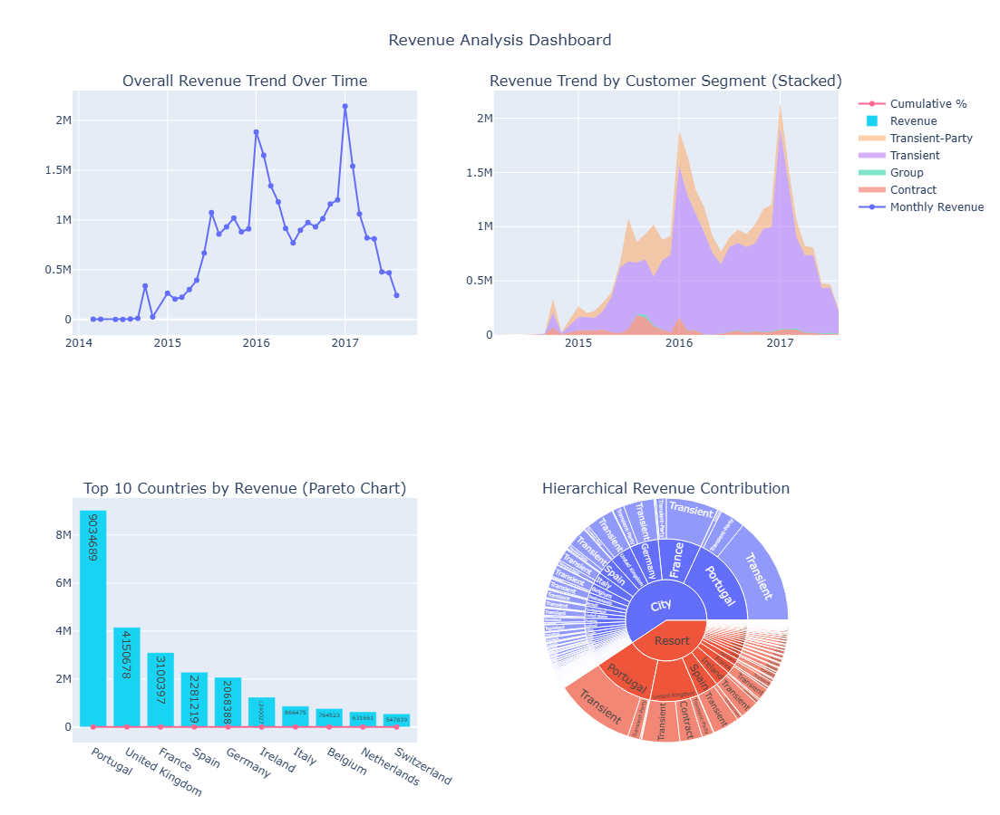

In [35]:
Monthly_revenue = SHG_Booking.groupby('Booking_Month_Year')['Revenue'].sum().reset_index()

monthly_segment_revenue = SHG_Booking.groupby(['Booking_Month_Year', 'Customer Type'])['Revenue'].sum().reset_index()

revenue_by_country = SHG_Booking.groupby('Country')['Revenue'].sum().sort_values(ascending=False).reset_index()
revenue_by_country['Cumulative %'] = 100 * revenue_by_country['Revenue'].cumsum() / revenue_by_country['Revenue'].sum()
top_10 = revenue_by_country.head(10)

fig = make_subplots(
    rows=2, cols=2,
    specs=[
        [{"type": "xy"}, {"type": "xy"}],
        [{"type": "xy"}, {"type": "domain"}] 
    ],
    subplot_titles=(
        "Overall Revenue Trend Over Time",
        "Revenue Trend by Customer Segment (Stacked)",
        "Top 10 Countries by Revenue (Pareto Chart)",
        "Hierarchical Revenue Contribution"
    )
)

fig.add_trace(
    go.Scatter(
        x=Monthly_revenue['Booking_Month_Year'],
        y=Monthly_revenue['Revenue'],
        mode='lines+markers',
        name='Monthly Revenue'
    ),
    row=1, col=1
)

for cust_type in monthly_segment_revenue['Customer Type'].unique():
    df_seg = monthly_segment_revenue[monthly_segment_revenue['Customer Type'] == cust_type]
    fig.add_trace(
        go.Scatter(
            x=df_seg['Booking_Month_Year'],
            y=df_seg['Revenue'],
            stackgroup='one',
            mode='none',
            name=cust_type
        ),
        row=1, col=2
    )

fig.add_trace(
    go.Bar(
        x=top_10['Country'],
        y=top_10['Revenue'],
        name='Revenue',
        text=top_10['Revenue'],
        textposition='auto'
    ),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(
        x=top_10['Country'],
        y=top_10['Cumulative %'],
        name='Cumulative %',
        yaxis='y2',
        mode='lines+markers'
    ),
    row=2, col=1
)

sunburst_fig = px.sunburst(SHG_Booking,
                  path=['Hotel', 'Country', 'Customer Type'],
                  values='Revenue')

fig.add_trace(
    sunburst_fig.data[0],
    row=2, col=2
)

fig.update_layout(
    height=900,
    width=1200,
    title_text="Revenue Analysis Dashboard",
    title_x=0.5,
    showlegend=True
)

fig.update_layout(
    yaxis5=dict(title='Revenue'), 
    yaxis6=dict(
        title='Cumulative %',
        overlaying='y5',
        side='right'
    )
)

fig.show()

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



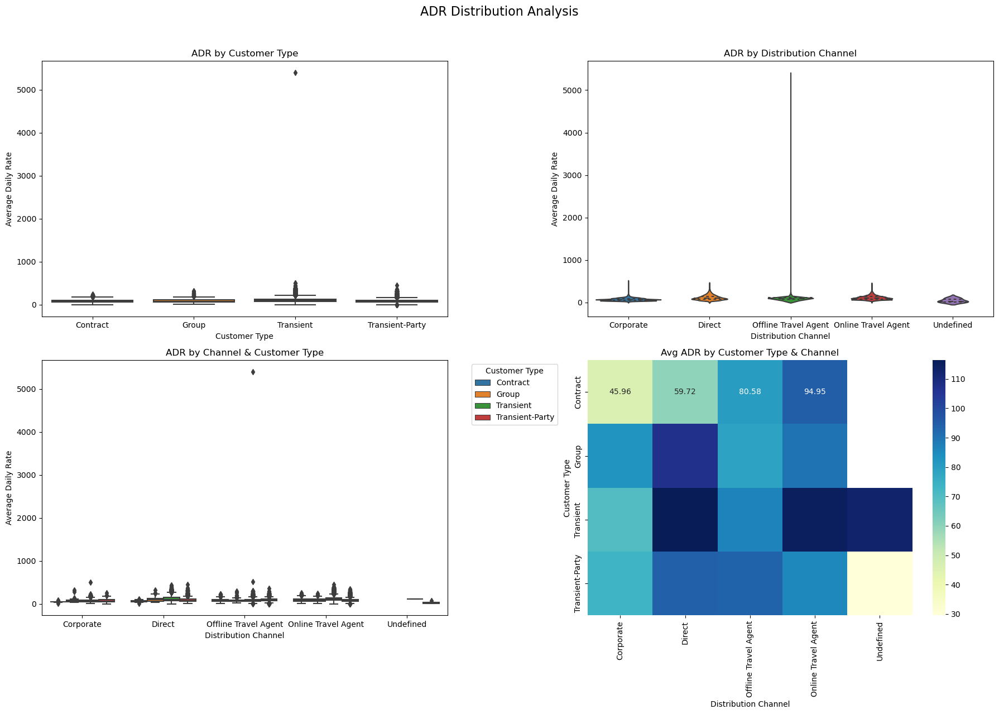

In [38]:
fig, axes = plt.subplots(2, 2, figsize=(18, 13))
fig.suptitle("ADR Distribution Analysis", fontsize=16, y=0.98)

sns.boxplot(data=SHG_Booking, x='Customer Type', y='Avg Daily Rate', ax=axes[0, 0])
axes[0, 0].set_title("ADR by Customer Type")
axes[0, 0].set_xlabel("Customer Type")
axes[0, 0].set_ylabel("Average Daily Rate")
axes[0, 0].tick_params(axis='x', rotation=0)


sns.violinplot(data=SHG_Booking, x='Distribution Channel', y='Avg Daily Rate', inner='quartile', ax=axes[0, 1])
axes[0, 1].set_title("ADR by Distribution Channel")
axes[0, 1].set_xlabel("Distribution Channel")
axes[0, 1].set_ylabel("Average Daily Rate")
axes[0, 1].tick_params(axis='x', rotation=0)

sns.boxplot(data=SHG_Booking, x='Distribution Channel', y='Avg Daily Rate', hue='Customer Type', ax=axes[1, 0])
axes[1, 0].set_title("ADR by Channel & Customer Type")
axes[1, 0].set_xlabel("Distribution Channel")
axes[1, 0].set_ylabel("Average Daily Rate")
axes[1, 0].tick_params(axis='x', rotation=0)
axes[1, 0].legend(title='Customer Type', bbox_to_anchor=(1.05, 1), loc='upper left')

pivot = SHG_Booking.pivot_table(
    values='Avg Daily Rate',
    index='Customer Type',
    columns='Distribution Channel',
    aggfunc='mean'
)
sns.heatmap(pivot, annot=True, fmt=".2f", cmap='YlGnBu', ax=axes[1, 1])
axes[1, 1].set_title("Avg ADR by Customer Type & Channel")
axes[1, 1].set_xlabel("Distribution Channel")
axes[1, 1].set_ylabel("Customer Type")

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle
plt.show()

Geographical Analysis:
●	How does the distribution of guests vary across different countries, and are there specific countries that should be targeted for marketing efforts?
●	Is there a correlation between the country of origin and the likelihood of cancellations or extended stays?


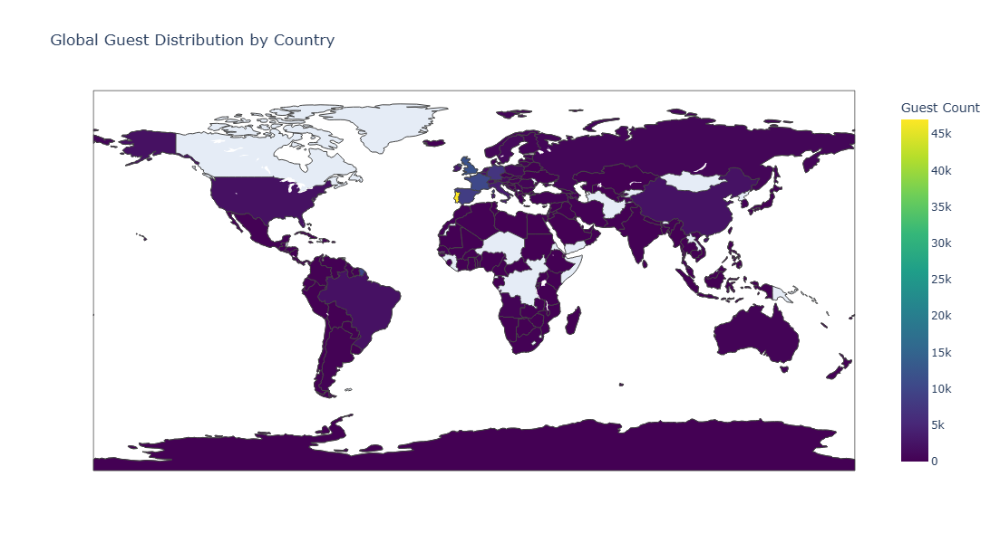

In [39]:
guest_by_country = SHG_Booking['Country'].value_counts().reset_index()
guest_by_country.columns = ['Country', 'Guest Count']

fig = px.choropleth(
    guest_by_country,
    locations='Country',
    locationmode='country names',
    color='Guest Count',
    color_continuous_scale='Viridis',
    title='Global Guest Distribution by Country'
)
fig.update_layout(height=600, width=1000)
fig.show()

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\4259324520.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\4259324520.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\plotly\express\_core.py

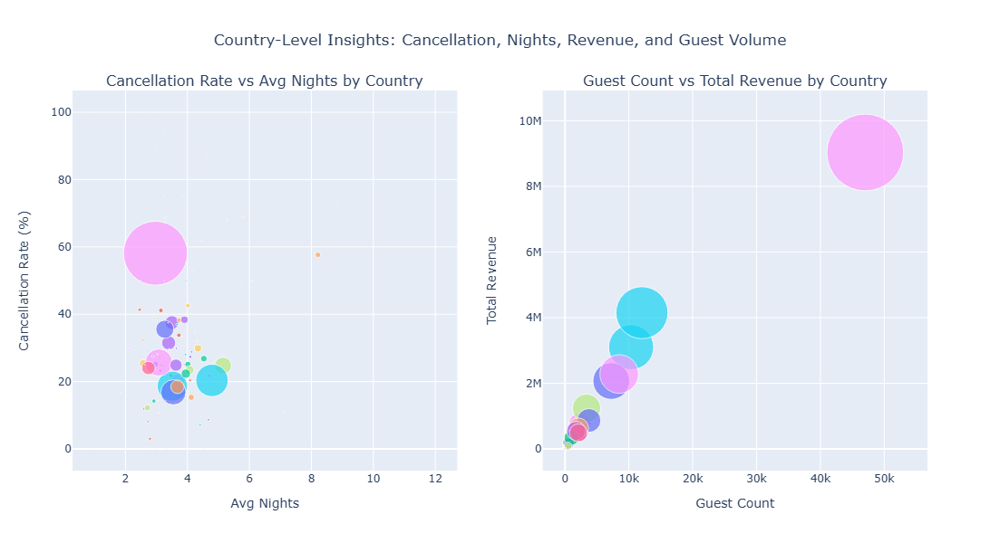

In [59]:
country_metrics = SHG_Booking.groupby('Country').agg(
    Guest_Count=('Booking ID', 'count'),
    Cancel_Count=('Cancelled', lambda x: (x == 'Yes').sum()),
    Avg_Nights=('Nights', 'mean'),
    Avg_ADR=('Avg Daily Rate', 'mean'),
    Total_Revenue=('Revenue', 'sum')
).reset_index()

country_metrics['Cancel_Rate (%)'] = 100 * country_metrics['Cancel_Count'] / country_metrics['Guest_Count']

revenue_by_country = SHG_Booking.groupby('Country').agg(
    Guest_Count=('Booking ID', 'count'),
    Total_Revenue=('Revenue', 'sum')
).reset_index()

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=(
        "Cancellation Rate vs Avg Nights by Country",
        "Guest Count vs Total Revenue by Country"
    )
)

scatter1 = px.scatter(
    country_metrics,
    x='Avg_Nights',
    y='Cancel_Rate (%)',
    size='Guest_Count',
    color='Country',
    hover_name='Country',
    size_max=50
)

for trace in scatter1.data:
    fig.add_trace(trace, row=1, col=1)

scatter2 = px.scatter(
    revenue_by_country,
    x='Guest_Count',
    y='Total_Revenue',
    size='Total_Revenue',
    color='Country',
    hover_name='Country',
    size_max=60
)

for trace in scatter2.data:
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(
    height=600,
    width=1200,
    title_text="Country-Level Insights: Cancellation, Nights, Revenue, and Guest Volume",
    title_x=0.5,
    showlegend=False
)

fig.update_xaxes(title_text="Avg Nights", row=1, col=1)
fig.update_yaxes(title_text="Cancellation Rate (%)", row=1, col=1)

fig.update_xaxes(title_text="Guest Count", row=1, col=2)
fig.update_yaxes(title_text="Total Revenue", row=1, col=2)

fig.show()


C:\Users\B.Salami\anaconda3\Lib\site-packages\plotly\express\_core.py:1619: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



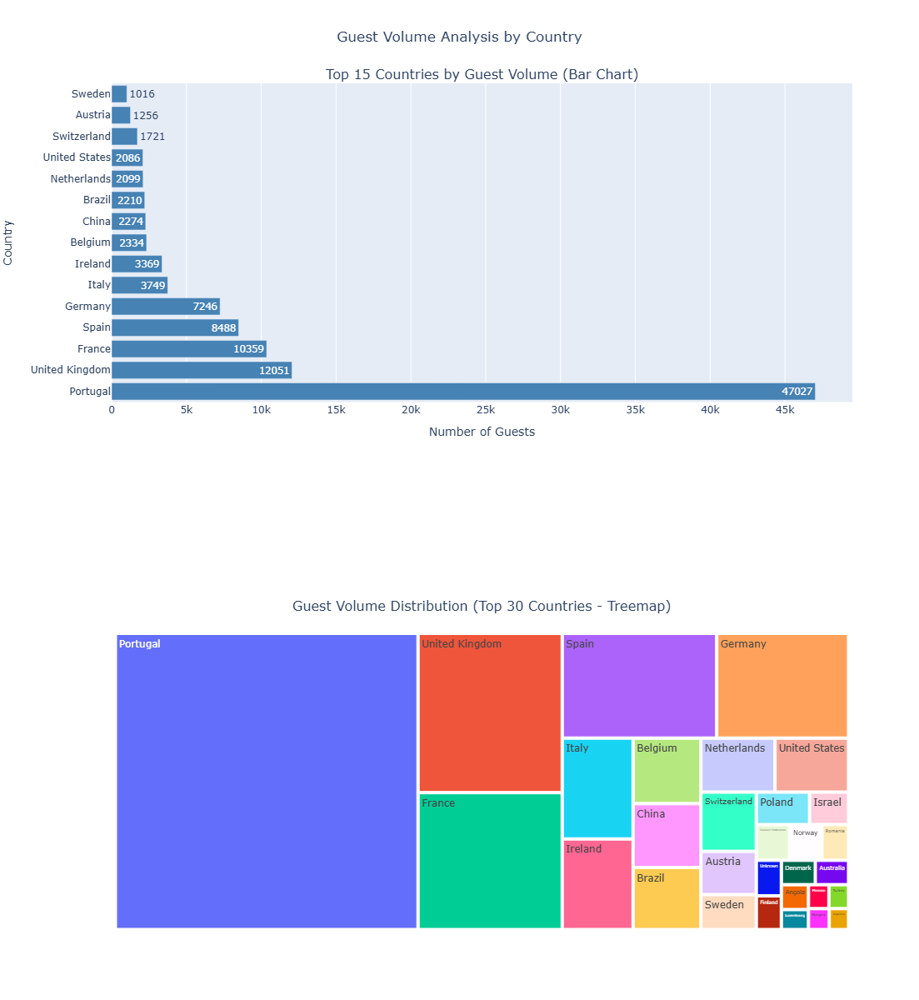

In [58]:
top_countries = guest_by_country.head(15)
top_30 = guest_by_country.head(30)

treemap = px.treemap(
    top_30,
    path=['Country'],
    values='Guest Count'
)

fig = make_subplots(
    rows=2, cols=1,
    specs=[[{"type": "xy"}], [{"type": "domain"}]],
    subplot_titles=(
        "Top 15 Countries by Guest Volume (Bar Chart)",
        "Guest Volume Distribution (Top 30 Countries - Treemap)"
    )
)

fig.add_trace(
    go.Bar(
        x=top_countries['Guest Count'],
        y=top_countries['Country'],
        orientation='h',
        text=top_countries['Guest Count'],
        textposition='auto',
        marker_color='steelblue',
        name='Guest Count'
    ),
    row=1, col=1
)

fig.add_trace(
    treemap.data[0],
    row=2, col=1
)

fig.update_layout(
    height=1200,
    width=1000,
    title_text="Guest Volume Analysis by Country",
    title_x=0.5,
    showlegend=False
)

fig.update_xaxes(title_text="Number of Guests", row=1, col=1)
fig.update_yaxes(title_text="Country", row=1, col=1)

fig.show()


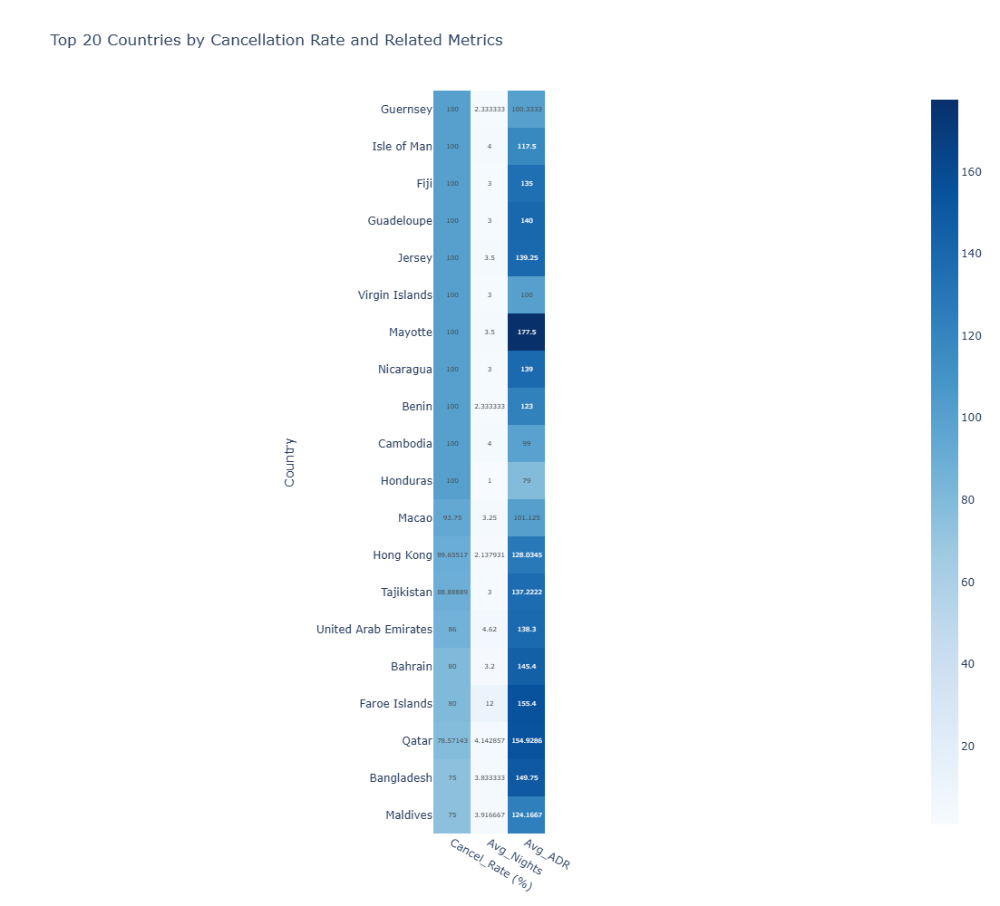

In [44]:
heat_df = country_metrics[['Country', 'Cancel_Rate (%)', 'Avg_Nights', 'Avg_ADR']]
heat_df.set_index('Country', inplace=True)

fig = px.imshow(
    heat_df.sort_values('Cancel_Rate (%)', ascending=False).head(20),
    color_continuous_scale='Blues',
    text_auto=True,
    title='Top 20 Countries by Cancellation Rate and Related Metrics'
)
fig.update_layout(height=1000, width=900)
fig.show()


Operational Efficiency:
●	What is the average length of stay for guests, and how does it differ based on booking channels or customer types?
●	Are there patterns in check-out dates that can inform staffing and resource allocation strategies?


C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\2616340065.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py

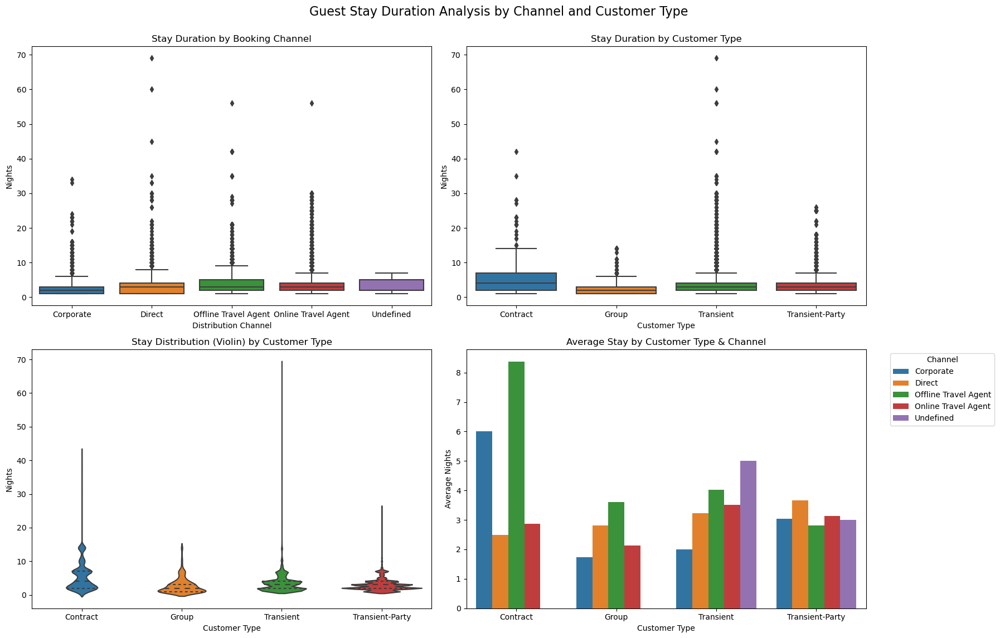

In [60]:
mean_stay = SHG_Booking.groupby(['Customer Type', 'Distribution Channel'])['Nights'].mean().reset_index()

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle("Guest Stay Duration Analysis by Channel and Customer Type", fontsize=16, y=0.95)

sns.boxplot(data=SHG_Booking, x='Distribution Channel', y='Nights', ax=axes[0, 0])
axes[0, 0].set_title('Stay Duration by Booking Channel')
axes[0, 0].set_xlabel('Distribution Channel')
axes[0, 0].set_ylabel('Nights')

sns.boxplot(data=SHG_Booking, x='Customer Type', y='Nights', ax=axes[0, 1])
axes[0, 1].set_title('Stay Duration by Customer Type')
axes[0, 1].set_xlabel('Customer Type')
axes[0, 1].set_ylabel('Nights')

sns.violinplot(data=SHG_Booking, x='Customer Type', y='Nights', inner='quartile', ax=axes[1, 0])
axes[1, 0].set_title('Stay Distribution (Violin) by Customer Type')
axes[1, 0].set_xlabel('Customer Type')
axes[1, 0].set_ylabel('Nights')

sns.barplot(data=mean_stay, x='Customer Type', y='Nights', hue='Distribution Channel', ax=axes[1, 1])
axes[1, 1].set_title('Average Stay by Customer Type & Channel')
axes[1, 1].set_xlabel('Customer Type')
axes[1, 1].set_ylabel('Average Nights')
axes[1, 1].legend(title='Channel', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

C:\Users\B.Salami\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



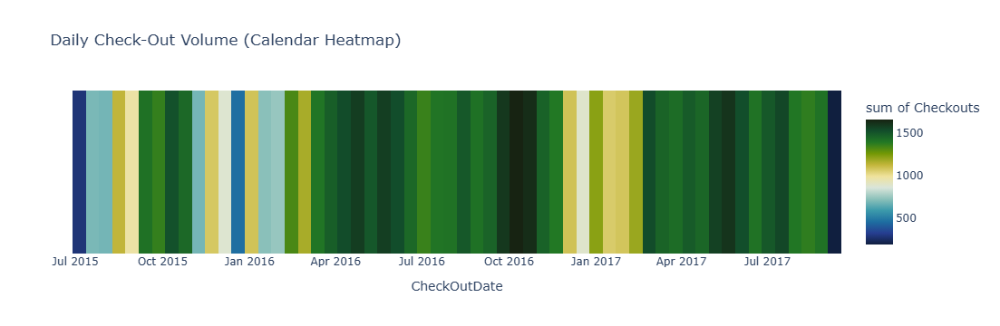

In [61]:
checkouts = SHG_Booking[SHG_Booking['Status'] == 'Check-Out'].copy()
checkouts['CheckOutDate'] = pd.to_datetime(checkouts['Status Update'])

daily_counts = checkouts.groupby('CheckOutDate').size().reset_index(name='Checkouts')

fig = px.density_heatmap(
    daily_counts,
    x='CheckOutDate',
    y=[1] * len(daily_counts), 
    z='Checkouts',
    nbinsx=100,
    title='Daily Check-Out Volume (Calendar Heatmap)',
    color_continuous_scale='delta'
)
fig.update_yaxes(visible=False)
fig.update_layout(height=350, width=1000)
fig.show()

C:\Users\B.Salami\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



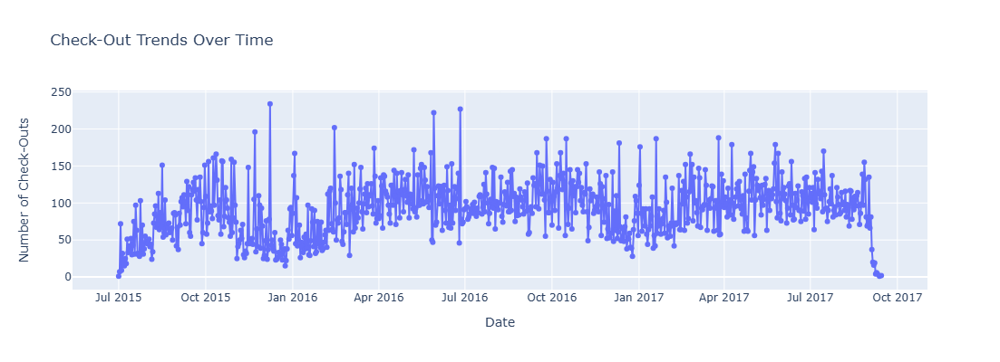

In [62]:
time_series = checkouts.groupby('CheckOutDate').size().reset_index(name='Checkouts')

fig = px.line(
    time_series,
    x='CheckOutDate',
    y='Checkouts',
    title='Check-Out Trends Over Time',
    markers=True
)
fig.update_layout(height=400, width=1000, xaxis_title='Date', yaxis_title='Number of Check-Outs')
fig.show()

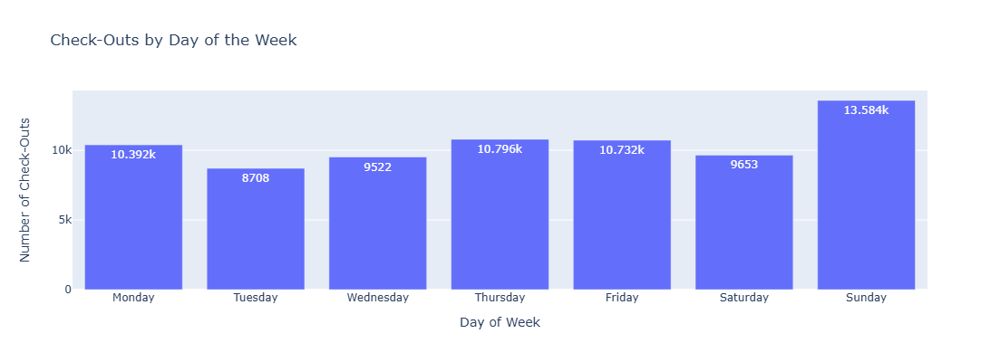

In [63]:
checkouts['DayOfWeek'] = checkouts['CheckOutDate'].dt.day_name()
dow_counts = checkouts['DayOfWeek'].value_counts().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
).reset_index()
dow_counts.columns = ['Day', 'Checkouts']

fig = px.bar(
    dow_counts,
    x='Day',
    y='Checkouts',
    title='Check-Outs by Day of the Week',
    text_auto=True
)
fig.update_layout(height=400, width=800, xaxis_title='Day of Week', yaxis_title='Number of Check-Outs')
fig.show()


Impact of Deposit Types:
●	How does the presence or absence of a deposit impact the likelihood of cancellations and revenue generation?
●	Can we identify any patterns in the use of deposit types across different customer segments?


C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\2896485458.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\2896485458.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641

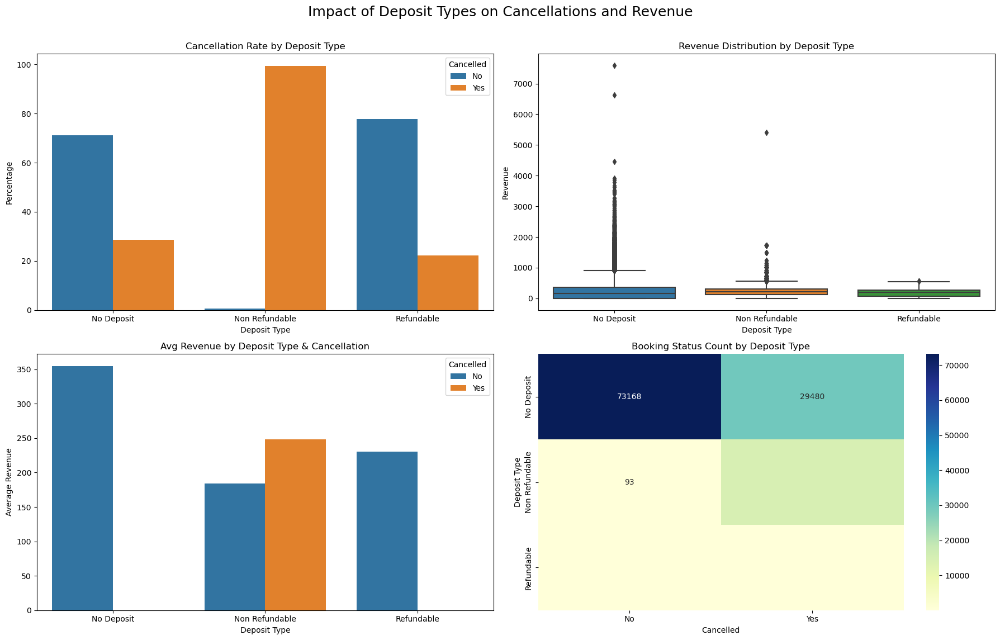

In [64]:
cancel_stats = SHG_Booking.groupby('Deposit Type')['Cancelled'].value_counts(normalize=True).unstack().fillna(0) * 100
cancel_stats = cancel_stats.reset_index().melt(id_vars='Deposit Type', var_name='Cancelled', value_name='Percentage')

grouped_rev = SHG_Booking.groupby(['Deposit Type', 'Cancelled'])['Revenue'].mean().reset_index()

contingency = pd.crosstab(SHG_Booking['Deposit Type'], SHG_Booking['Cancelled'])

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle("Impact of Deposit Types on Cancellations and Revenue", fontsize=18, y=0.95)

sns.barplot(data=cancel_stats, x='Deposit Type', y='Percentage', hue='Cancelled', ax=axes[0, 0])
axes[0, 0].set_title('Cancellation Rate by Deposit Type')
axes[0, 0].set_ylabel('Percentage')
axes[0, 0].set_xlabel('Deposit Type')

sns.boxplot(data=SHG_Booking, x='Deposit Type', y='Revenue', ax=axes[0, 1])
axes[0, 1].set_title('Revenue Distribution by Deposit Type')
axes[0, 1].set_ylabel('Revenue')
axes[0, 1].set_xlabel('Deposit Type')

sns.barplot(data=grouped_rev, x='Deposit Type', y='Revenue', hue='Cancelled', ax=axes[1, 0])
axes[1, 0].set_title('Avg Revenue by Deposit Type & Cancellation')
axes[1, 0].set_ylabel('Average Revenue')
axes[1, 0].set_xlabel('Deposit Type')

sns.heatmap(contingency, annot=True, fmt='d', cmap='YlGnBu', ax=axes[1, 1])
axes[1, 1].set_title('Booking Status Count by Deposit Type')
axes[1, 1].set_xlabel('Cancelled')
axes[1, 1].set_ylabel('Deposit Type')

plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()

C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\3281126259.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



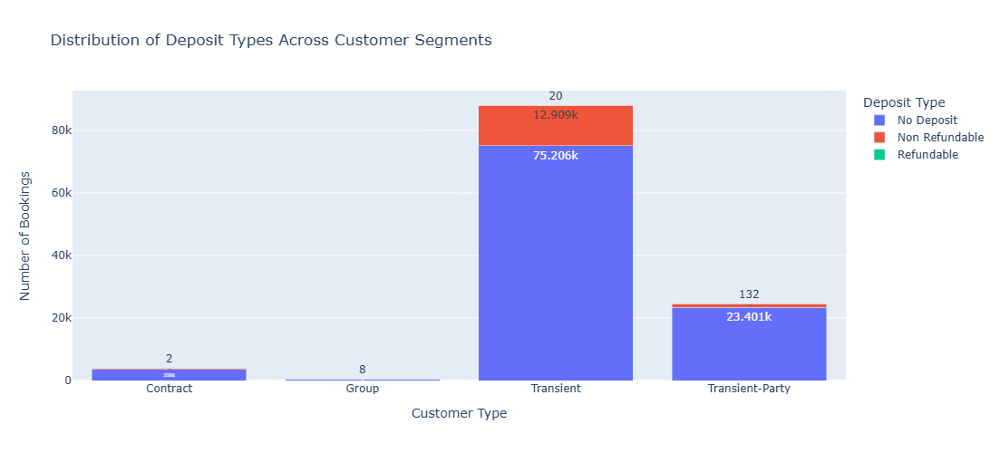

In [65]:
deposit_segment = SHG_Booking.groupby(['Customer Type', 'Deposit Type']).size().reset_index(name='Count')

fig = px.bar(
    deposit_segment,
    x='Customer Type',
    y='Count',
    color='Deposit Type',
    title='Distribution of Deposit Types Across Customer Segments',
    barmode='stack',
    text_auto=True
)
fig.update_layout(height=500, width=900, yaxis_title='Number of Bookings')
fig.show()



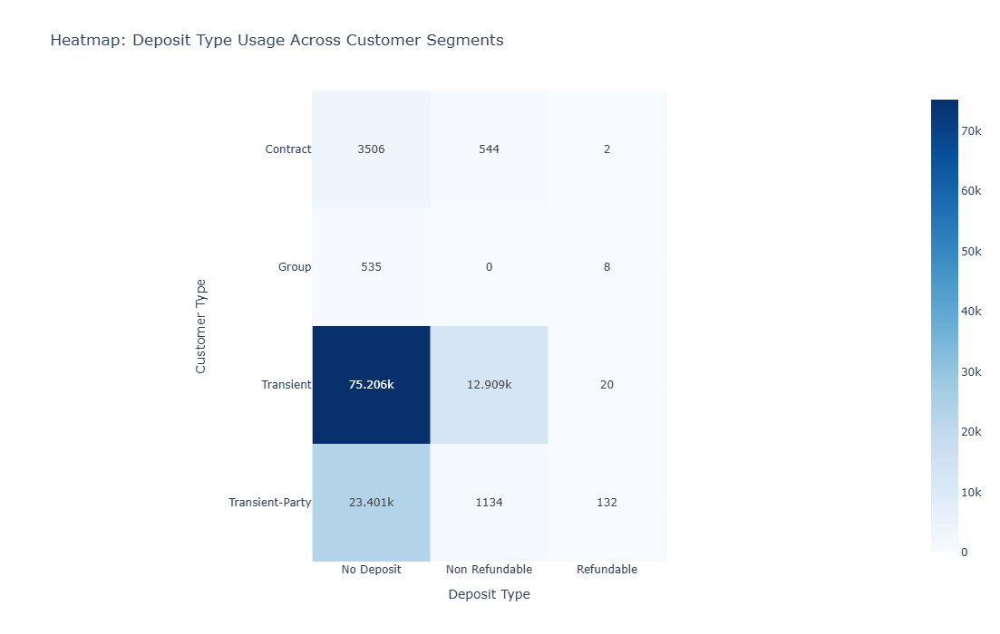

In [66]:
pivot = SHG_Booking.pivot_table(
    index='Customer Type',
    columns='Deposit Type',
    values='Booking ID',
    aggfunc='count',
    fill_value=0
)

fig = px.imshow(
    pivot,
    text_auto=True,
    color_continuous_scale='Blues',
    title='Heatmap: Deposit Type Usage Across Customer Segments'
)
fig.update_layout(height=700, width=1000)
fig.show()


Analysis of Corporate Bookings:
●	What is the proportion of corporate bookings, and how does their Average Daily Rate (ADR) compare to other customer types?
●	Are there specific trends or patterns related to corporate bookings that can inform business strategies?


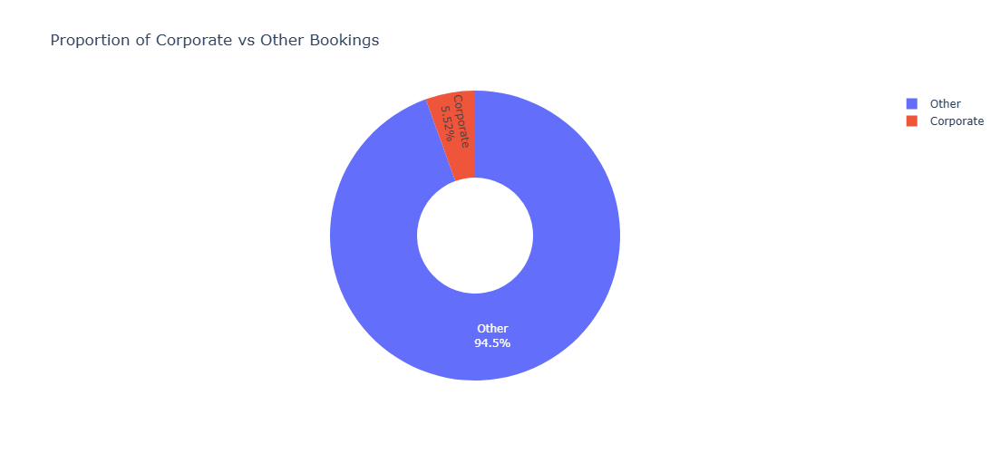

In [68]:
SHG_Booking['Is_Corporate'] = SHG_Booking['Distribution Channel'].apply(
    lambda x: 'Corporate' if x == 'Corporate' else 'Other'
)

corp_counts = SHG_Booking['Is_Corporate'].value_counts().reset_index()
corp_counts.columns = ['Booking Type', 'Count']

fig = px.pie(
    corp_counts,
    names='Booking Type',
    values='Count',
    title='Proportion of Corporate vs Other Bookings',
    hole=0.4 
)
fig.update_traces(textinfo='percent+label')
fig.update_layout(height=500, width=500)
fig.show()

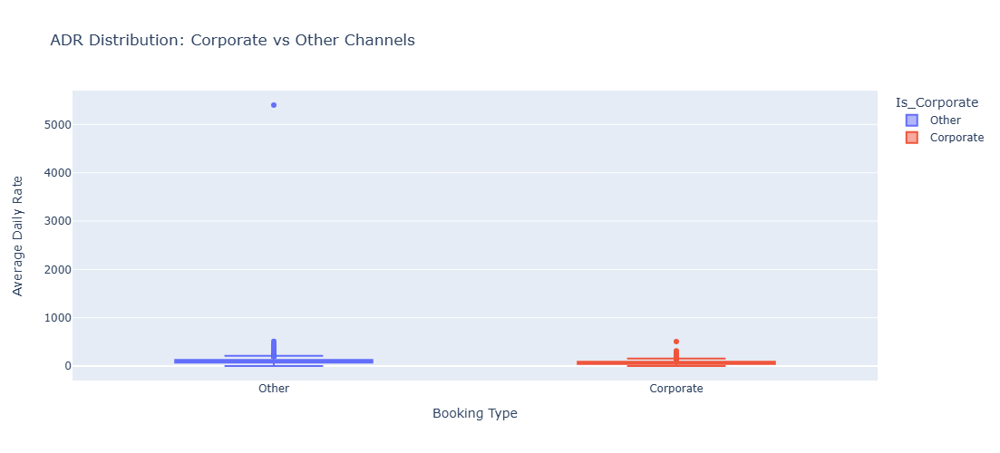

In [69]:
fig = px.box(
    SHG_Booking,
    x='Is_Corporate',
    y='Avg Daily Rate',
    color='Is_Corporate',
    title='ADR Distribution: Corporate vs Other Channels'
)
fig.update_layout(height=500, width=800, yaxis_title='Average Daily Rate', xaxis_title='Booking Type')
fig.show()


C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\3561106579.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



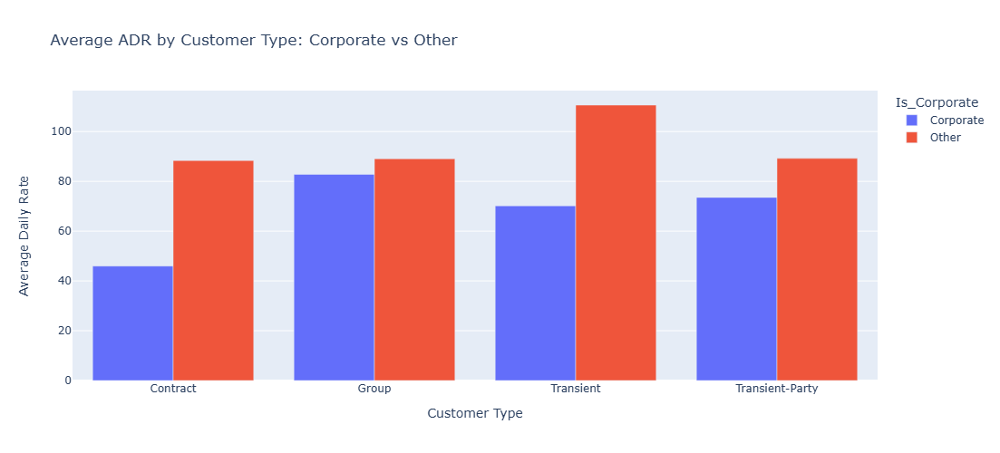

In [70]:
adr_by_segment = SHG_Booking.groupby(['Customer Type', 'Is_Corporate'])['Avg Daily Rate'].mean().reset_index()

fig = px.bar(
    adr_by_segment,
    x='Customer Type',
    y='Avg Daily Rate',
    color='Is_Corporate',
    barmode='group',
    title='Average ADR by Customer Type: Corporate vs Other'
)
fig.update_layout(height=500, width=900, yaxis_title='Average Daily Rate')
fig.show()


C:\Users\B.Salami\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\B.Salami\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\B.Salami\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\B.Salami\anac

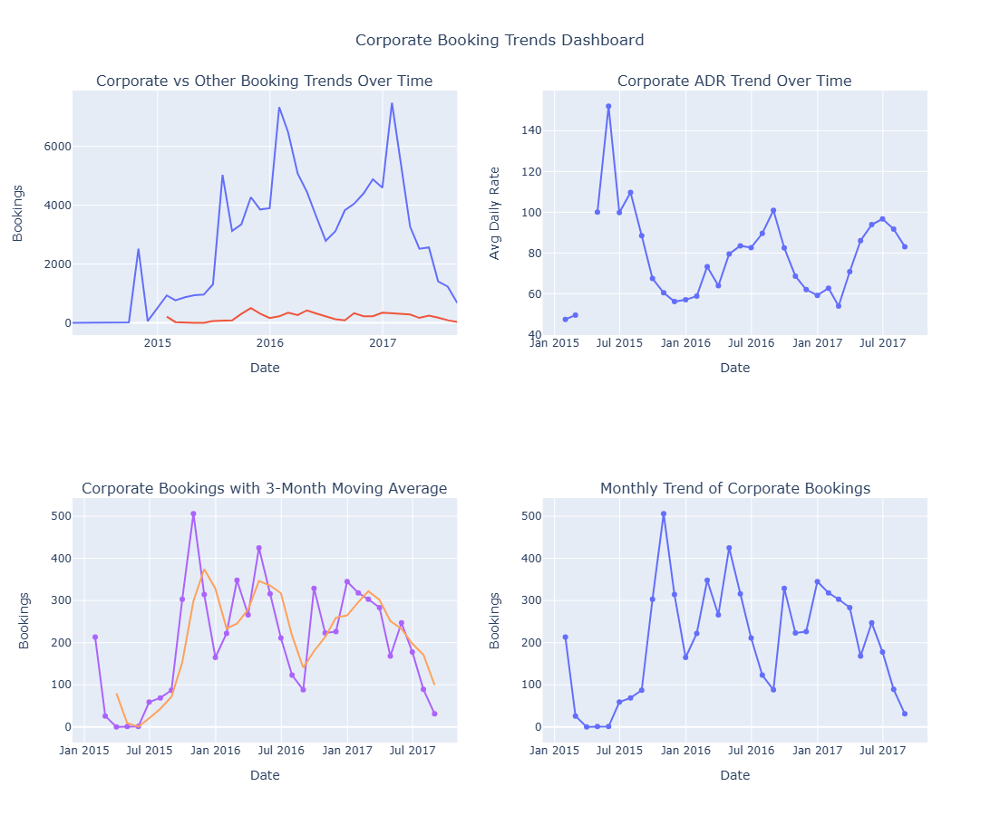

In [76]:
SHG_Booking['Is_Corporate'] = SHG_Booking['Distribution Channel'].apply(lambda x: 'Corporate' if x == 'Corporate' else 'Other')

volume_trend = SHG_Booking.groupby([pd.Grouper(key='Booking Date', freq='M'), 'Is_Corporate']).size().reset_index(name='Count')

corporate_df = SHG_Booking[SHG_Booking['Distribution Channel'] == 'Corporate'].copy()
adr_trend = corporate_df.resample('M', on='Booking Date')['Avg Daily Rate'].mean().reset_index()

corporate_monthly = corporate_df.resample('M', on='Booking Date').size().reset_index(name='Corporate Bookings')
corporate_monthly['Moving Avg (3-mo)'] = corporate_monthly['Corporate Bookings'].rolling(window=3).mean()

fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=[
        "Corporate vs Other Booking Trends Over Time",
        "Corporate ADR Trend Over Time",
        "Corporate Bookings with 3-Month Moving Average",
        "Monthly Trend of Corporate Bookings"
    ]
)

line1 = px.line(volume_trend, x='Booking Date', y='Count', color='Is_Corporate')
for trace in line1.data:
    fig.add_trace(trace, row=1, col=1)
    
line2 = px.line(adr_trend, x='Booking Date', y='Avg Daily Rate', markers=True)
for trace in line2.data:
    fig.add_trace(trace, row=1, col=2)

fig.add_trace(
    go.Scatter(
        x=corporate_monthly['Booking Date'],
        y=corporate_monthly['Corporate Bookings'],
        mode='lines+markers',
        name='Corporate Bookings'
    ),
    row=2, col=1
)
fig.add_trace(
    go.Scatter(
        x=corporate_monthly['Booking Date'],
        y=corporate_monthly['Moving Avg (3-mo)'],
        mode='lines',
        name='3-Month Moving Avg'
    ),
    row=2, col=1
)

line4 = px.line(corporate_monthly, x='Booking Date', y='Corporate Bookings', markers=True)
for trace in line4.data:
    fig.add_trace(trace, row=2, col=2)

fig.update_layout(
    height=900,
    width=1200,
    title_text="Corporate Booking Trends Dashboard",
    title_x=0.5,
    showlegend=False
)

fig.update_xaxes(title_text="Date", row=1, col=1)
fig.update_yaxes(title_text="Bookings", row=1, col=1)

fig.update_xaxes(title_text="Date", row=1, col=2)
fig.update_yaxes(title_text="Avg Daily Rate", row=1, col=2)

fig.update_xaxes(title_text="Date", row=2, col=1)
fig.update_yaxes(title_text="Bookings", row=2, col=1)

fig.update_xaxes(title_text="Date", row=2, col=2)
fig.update_yaxes(title_text="Bookings", row=2, col=2)

fig.show()


Time-to-Event Analysis:
●	How does the time between booking and arrival date (lead time) affect revenue and the likelihood of cancellations?
●	Are there specific lead time ranges that are associated with higher customer satisfaction or revenue?


C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



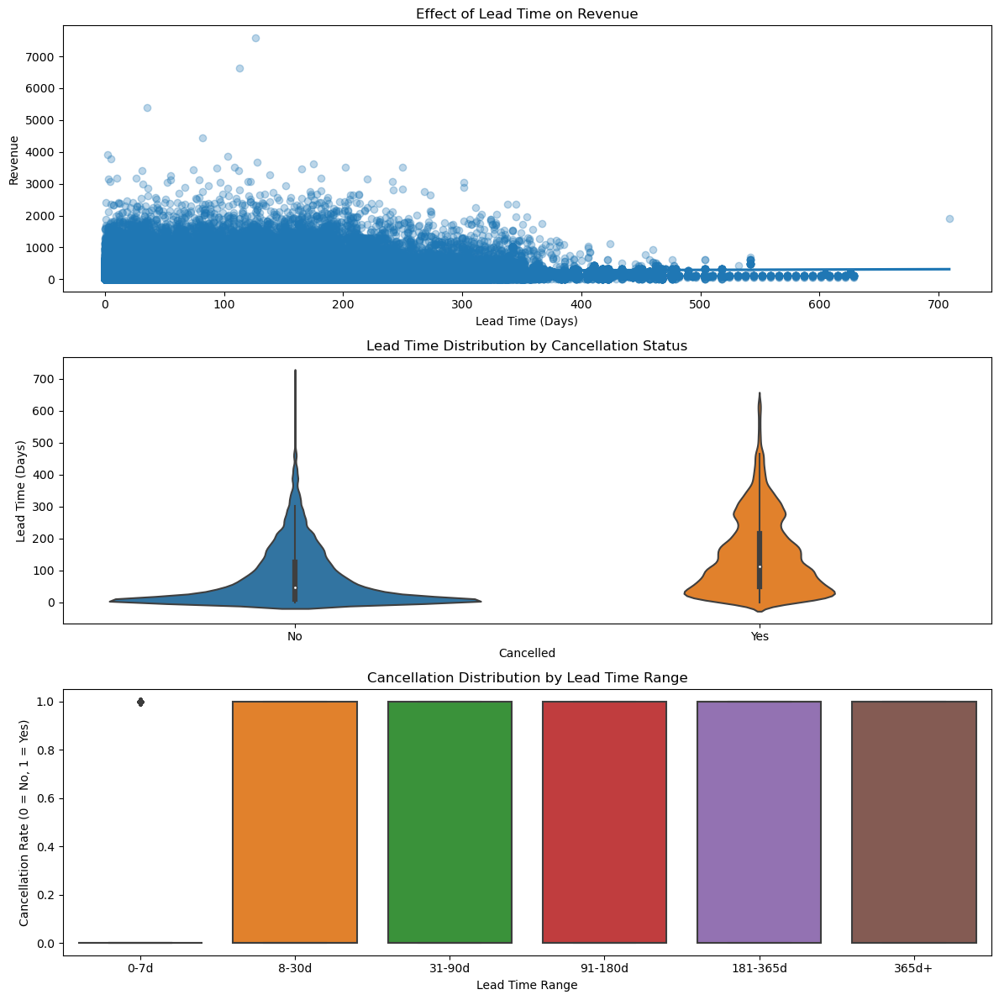

In [77]:
SHG_Booking['Cancelled_num'] = SHG_Booking['Cancelled'].map({'Yes': 1, 'No': 0}).astype(float)

SHG_Booking['LeadTimeBin'] = pd.cut(
    SHG_Booking['Lead Time'],
    bins=[0, 7, 30, 90, 180, 365, SHG_Booking['Lead Time'].max()],
    labels=['0-7d', '8-30d', '31-90d', '91-180d', '181-365d', '365d+']
)

fig, axs = plt.subplots(3, 1, figsize=(12, 12))  

sns.regplot(data=SHG_Booking, x='Lead Time', y='Revenue', scatter_kws={'alpha': 0.3}, ax=axs[0])
axs[0].set_title('Effect of Lead Time on Revenue')
axs[0].set_xlabel('Lead Time (Days)')
axs[0].set_ylabel('Revenue')

sns.violinplot(data=SHG_Booking, x='Cancelled', y='Lead Time', ax=axs[1])
axs[1].set_title("Lead Time Distribution by Cancellation Status")
axs[1].set_xlabel("Cancelled")
axs[1].set_ylabel("Lead Time (Days)")

sns.boxplot(data=SHG_Booking, x='LeadTimeBin', y='Cancelled_num', ax=axs[2])
axs[2].set_title('Cancellation Distribution by Lead Time Range')
axs[2].set_xlabel('Lead Time Range')
axs[2].set_ylabel('Cancellation Rate (0 = No, 1 = Yes)')

plt.tight_layout()
plt.show()

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\B.Salami\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



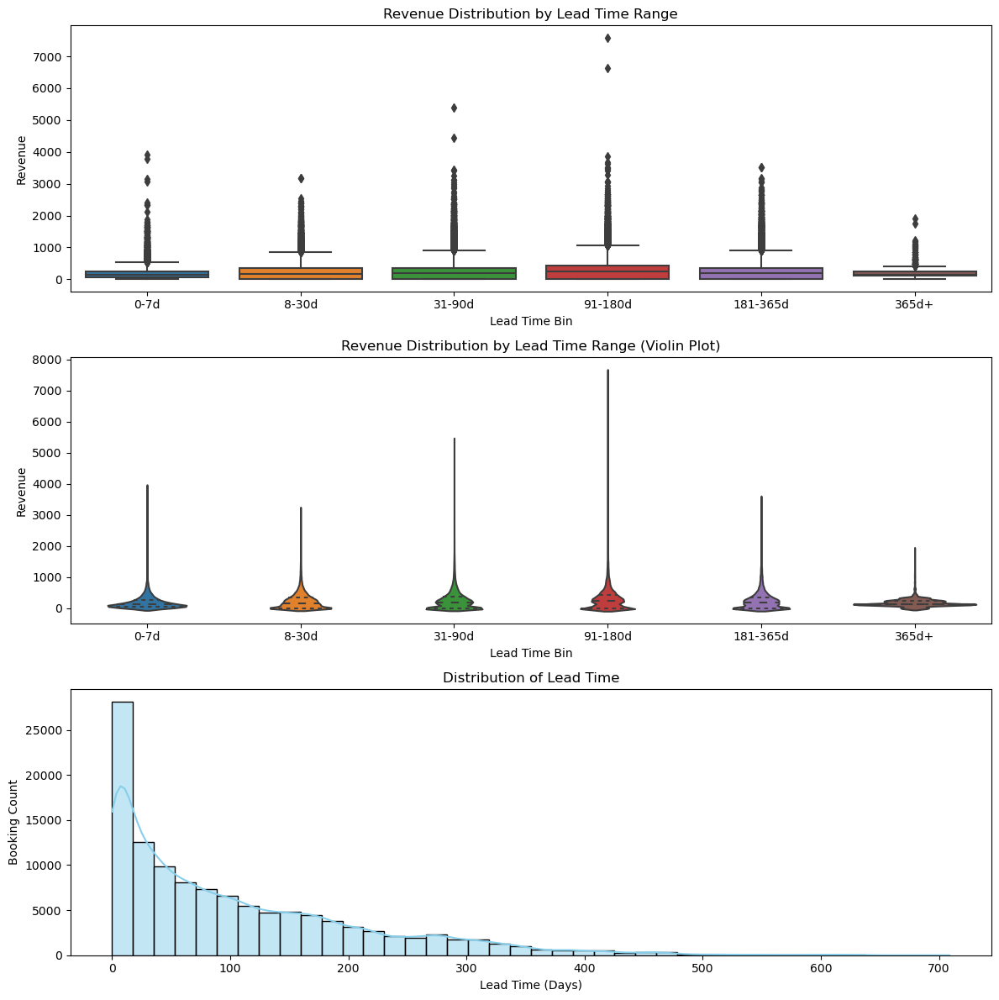

In [78]:
fig, axs = plt.subplots(3, 1, figsize=(12, 12))

sns.boxplot(data=SHG_Booking, x='LeadTimeBin', y='Revenue', ax=axs[0])
axs[0].set_title('Revenue Distribution by Lead Time Range')
axs[0].set_xlabel('Lead Time Bin')
axs[0].set_ylabel('Revenue')

sns.violinplot(data=SHG_Booking, x='LeadTimeBin', y='Revenue', inner='quartile', ax=axs[1])
axs[1].set_title('Revenue Distribution by Lead Time Range (Violin Plot)')
axs[1].set_xlabel('Lead Time Bin')
axs[1].set_ylabel('Revenue')

sns.histplot(SHG_Booking['Lead Time'], bins=40, kde=True, color='skyblue', ax=axs[2])
axs[2].set_title('Distribution of Lead Time')
axs[2].set_xlabel('Lead Time (Days)')
axs[2].set_ylabel('Booking Count')

plt.tight_layout()
plt.show()

Comparison of Online and Offline Travel Agents:
●	What is the revenue contribution of online travel agents compared to offline travel agents?
●	How do cancellation rates and revenue vary between bookings made through online and offline travel agents?


C:\Users\B.Salami\AppData\Local\Temp\ipykernel_11296\1392639414.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



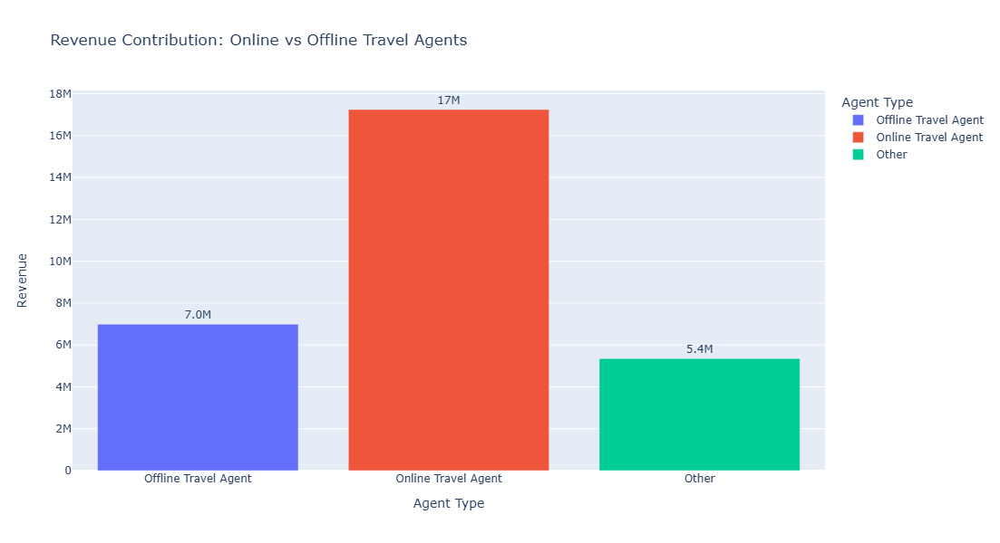

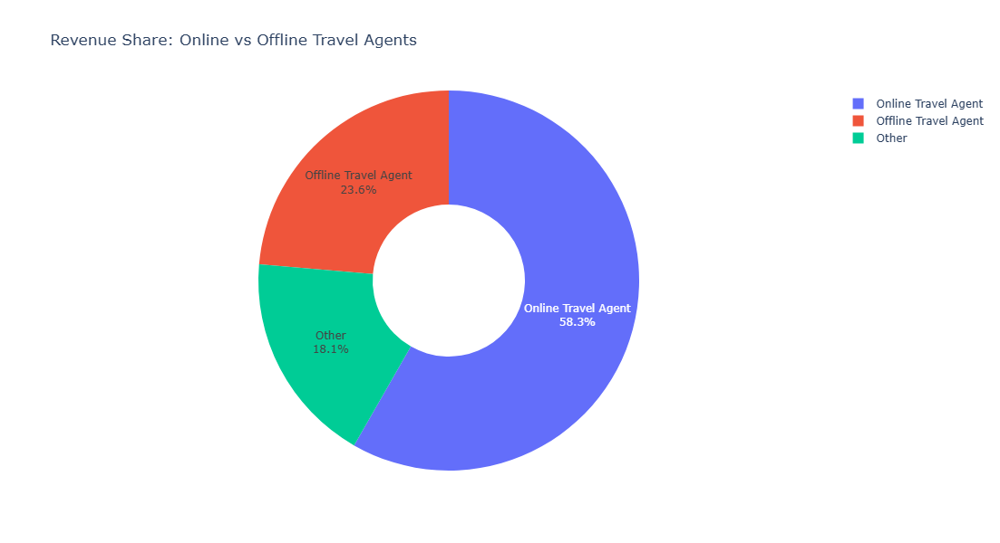

In [79]:
revenue_by_channel = SHG_Booking.groupby('Distribution Channel')['Revenue'].sum().reset_index()

revenue_by_channel = revenue_by_channel.sort_values(by='Revenue', ascending=False)

def categorize_agent(channel):
    if 'online' in channel.lower():
        return 'Online Travel Agent'
    elif 'offline' in channel.lower():
        return 'Offline Travel Agent'
    else:
        return 'Other'

SHG_Booking['Agent Type'] = SHG_Booking['Distribution Channel'].apply(categorize_agent)

revenue_comparison = SHG_Booking.groupby('Agent Type')['Revenue'].sum().reset_index()


fig_bar = px.bar(
    revenue_comparison,
    x='Agent Type',
    y='Revenue',
    title='Revenue Contribution: Online vs Offline Travel Agents',
    text='Revenue',
    color='Agent Type'
)
fig_bar.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig_bar.update_layout(
    uniformtext_minsize=8,
    uniformtext_mode='hide',
    width=1000,  # Increased width
    height=600   # Increased height
)
fig_bar.show()

# Pie Chart
fig_pie = px.pie(
    revenue_comparison,
    names='Agent Type',
    values='Revenue',
    title='Revenue Share: Online vs Offline Travel Agents',
    hole=0.4  # Donut chart
)
fig_pie.update_traces(textinfo='percent+label')
fig_pie.update_layout(
    width=800,   # Increased width
    height=600   # Increased height
)
fig_pie.update_traces(textinfo='percent+label')
fig_pie.show()


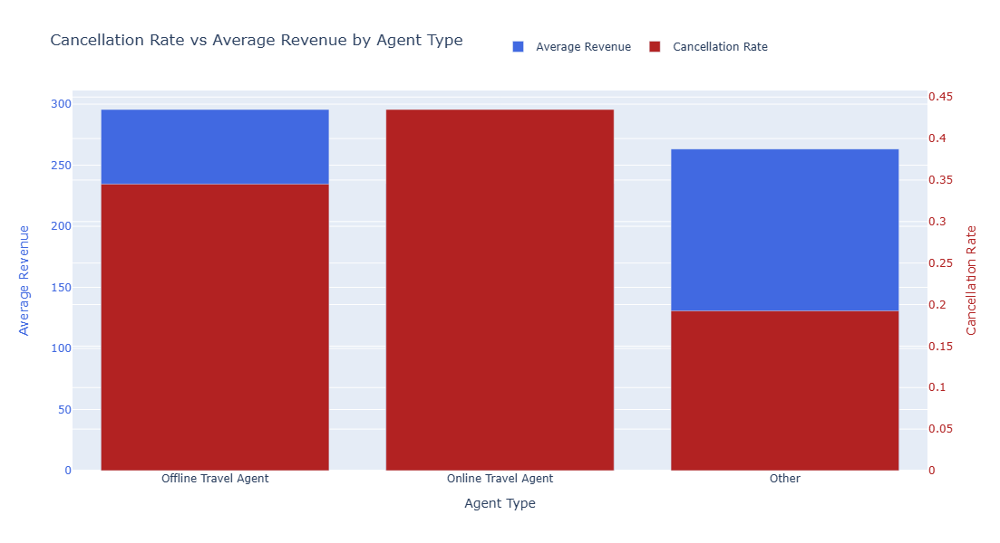

In [80]:
summary = SHG_Booking.groupby('Agent Type').agg(
    Total_Bookings=('Booking ID', 'count'),
    Total_Revenue=('Revenue', 'sum'),
    Cancellations=('Cancelled_num', 'sum')  # Assuming 'Is Canceled' is 1 if canceled, 0 if not
).reset_index()

summary['Cancellation_Rate'] = summary['Cancellations'] / summary['Total_Bookings']
summary['Avg_Revenue'] = summary['Total_Revenue'] / summary['Total_Bookings']

fig = go.Figure()

fig.add_trace(go.Bar(
    x=summary['Agent Type'],
    y=summary['Avg_Revenue'],
    name='Average Revenue',
    yaxis='y1',
    marker=dict(color='royalblue')
))

fig.add_trace(go.Bar(
    x=summary['Agent Type'],
    y=summary['Cancellation_Rate'],
    name='Cancellation Rate',
    yaxis='y2',
    marker=dict(color='firebrick')
))

fig.update_layout(
    title='Cancellation Rate vs Average Revenue by Agent Type',
    xaxis=dict(title='Agent Type'),
    yaxis=dict(
        title='Average Revenue',
        titlefont=dict(color='royalblue'),
        tickfont=dict(color='royalblue')
    ),
    yaxis2=dict(
        title='Cancellation Rate',
        titlefont=dict(color='firebrick'),
        tickfont=dict(color='firebrick'),
        overlaying='y',
        side='right'
    ),
    legend=dict(x=0.5, y=1.15, orientation='h'),
    width=1000,
    height=600,
    barmode='group'
)

fig.show()
